<a href="https://colab.research.google.com/github/EstTec85/Galaxia/blob/main/Galaxias.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Vectorización y Selección de Características para la Clasificación de Galaxias**

# Introducción

Este documento explica detalladamente los resultados obtenidos, las decisiones tomadas para evitar el sobreajuste (overfitting), las técnicas de preprocesamiento empleadas, el uso de bases de datos vectorizadas como Pinecone y la aplicación de ANOVA como método de selección de características. Además, se explica cómo estos vectores se almacenaron en dos espacios de nombres (namespaces) y cómo pueden ser utilizados para entrenar una red neuronal convolucional (CNN).

In [5]:
# prompt: montar google drive una carpeta compartida

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Resultados y Decisiones Clave

**Problema del Sobreajuste (Overfitting)**

Causa:

Durante las pruebas iniciales, observamos una precisión perfecta en los modelos, lo que indicó que los modelos memorizaron los datos de entrenamiento en lugar de generalizar correctamente.

Esto ocurrió debido a la falta de regularización y a que las técnicas de preprocesamiento originales no ayudaban a destacar patrones relevantes.



In [6]:
import os
import random
import shutil

# Ruta de la carpeta con las imágenes
IMAGE_PATH = "/content/drive/MyDrive/CNN/Mor_Image"
SAMPLE_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"
SAMPLE_SIZE = 213  # Tamaño calculado de la muestra

# Crear carpeta para el sample
os.makedirs(SAMPLE_PATH, exist_ok=True)

# Listar todas las imágenes en la carpeta original
all_images = [f for f in os.listdir(IMAGE_PATH) if os.path.isfile(os.path.join(IMAGE_PATH, f))]

# Seleccionar imágenes aleatoriamente
sample_images = random.sample(all_images, SAMPLE_SIZE)

# Copiar las imágenes seleccionadas al directorio de muestra
for img_name in sample_images:
    src_path = os.path.join(IMAGE_PATH, img_name)
    dst_path = os.path.join(SAMPLE_PATH, img_name)
    shutil.copy(src_path, dst_path)

print(f"Muestra creada con {len(sample_images)} imágenes en {SAMPLE_PATH}")


Muestra creada con 213 imágenes en /content/drive/MyDrive/CNN/Sample_Mor_Image



EDA para Galaxias vs No Galaxias:
Total de imágenes: 426
Tamaños únicos: {(424, 424), (800, 800)}


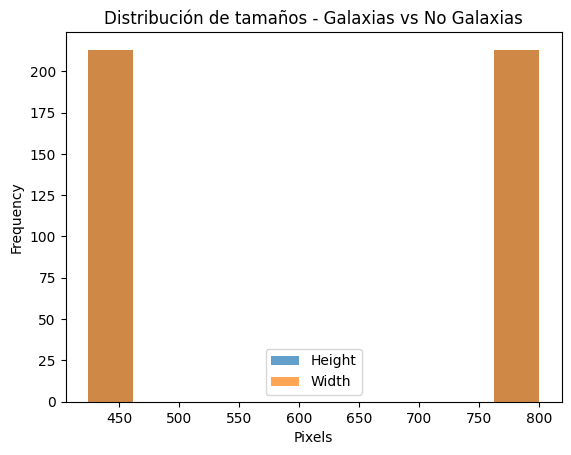


Evaluando técnicas de preprocesamiento para Galaxias vs No Galaxias...
Técnica: resize_normalize
Precisión: 1.0
Técnica: grayscale
Precisión: 1.0
Técnica: histogram_equalization
Precisión: 0.930232584476471
Técnica: gaussian_blur
Precisión: 1.0

Mejor técnica para Galaxias vs No Galaxias: resize_normalize con precisión 1.0

Entrenando modelo para Galaxias vs No Galaxias con Cross-Validation...

Fold 1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step

Fold 2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step

Fold 3


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step

Fold 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step

Fold 5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step

Promedio AUC para Galaxias vs No Galaxias: 1.00

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       213
           1       1.00      1.00      1.00       213

    accuracy                           1.00       426
   macro avg       1.00      1.00      1.00       426
weighted avg       1.00      1.00      1.00       426



In [ ]:
# Modelo 1: Clasificación Galaxias vs No Galaxias
#Encontrar Galaxias .

import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_curve, auc, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

# Parámetros globales
TARGET_SIZE = (128, 128)

# Técnicas de preprocesamiento
def resize_and_normalize(image):
    resized = cv2.resize(image, TARGET_SIZE)
    return resized / 255.0

def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, TARGET_SIZE)

def histogram_equalization(image):
    grayscale = convert_to_grayscale(image)
    return cv2.equalizeHist(grayscale)

def gaussian_blur(image):
    return cv2.GaussianBlur(cv2.resize(image, TARGET_SIZE), (5, 5), 0)

PREPROCESSING_TECHNIQUES = {
    "resize_normalize": resize_and_normalize,
    "grayscale": convert_to_grayscale,
    "histogram_equalization": histogram_equalization,
    "gaussian_blur": gaussian_blur,
}

# Cargar imágenes
def load_images(image_path, label, preprocess_fn=None):
    images = []
    labels = []
    for img_name in os.listdir(image_path):
        img_path = os.path.join(image_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar la imagen: {img_path}")
            continue
        if preprocess_fn:
            img = preprocess_fn(img)
        images.append(img)
        labels.append(label)
    return images, labels

# Crear modelo CNN
def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Clasificación binaria
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# EDA
def perform_eda(image_paths, labels, label_name):
    image_sizes = [img.shape[:2] for img in image_paths]
    unique_sizes = set(image_sizes)
    print(f"\nEDA para {label_name}:")
    print(f"Total de imágenes: {len(image_paths)}")
    print(f"Tamaños únicos: {unique_sizes}")
    plt.hist([size[0] for size in image_sizes], bins=10, alpha=0.7, label='Height')
    plt.hist([size[1] for size in image_sizes], bins=10, alpha=0.7, label='Width')
    plt.xlabel("Pixels")
    plt.ylabel("Frequency")
    plt.title(f"Distribución de tamaños - {label_name}")
    plt.legend()
    plt.show()

# Evaluar técnicas de preprocesamiento
def evaluate_preprocessing(images, labels, label_name):
    print(f"\nEvaluando técnicas de preprocesamiento para {label_name}...")
    results = []
    for technique_name, preprocess_fn in PREPROCESSING_TECHNIQUES.items():
        print(f"Técnica: {technique_name}")
        X = np.array([preprocess_fn(img) for img in images])
        y = np.array(labels)
        if len(X.shape) == 3:
            X = X[..., np.newaxis]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))
        history = model.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_test, y_test), verbose=0)
        val_loss, val_accuracy = model.evaluate(X_test, y_test, verbose=0)
        results.append((technique_name, val_accuracy))
        print(f"Precisión: {val_accuracy}")
    best_technique = max(results, key=lambda x: x[1])
    print(f"\nMejor técnica para {label_name}: {best_technique[0]} con precisión {best_technique[1]}")
    return best_technique[0]

# Entrenar y evaluar modelo con CV
def train_model_with_cv(images, labels, label_name, preprocess_fn):
    print(f"\nEntrenando modelo para {label_name} con Cross-Validation...")
    X = np.array([preprocess_fn(img) for img in images])
    y = np.array(labels)
    if len(X.shape) == 3:
        X = X[..., np.newaxis]
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    all_y_true, all_y_pred = [], []
    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\nFold {fold + 1}")
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))
        model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=0)
        y_pred_prob = model.predict(X_val).ravel()
        y_pred = (y_pred_prob > 0.5).astype(int)
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)
        fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
        auc_scores.append(auc(fpr, tpr))
    print(f"\nPromedio AUC para {label_name}: {np.mean(auc_scores):.2f}")
    print("\nReporte de Clasificación:")
    print(classification_report(all_y_true, all_y_pred))

# Galaxias vs No Galaxias
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

galaxy_images, galaxy_labels = load_images(GALAXY_PATH, 1)
dwarf_images, dwarf_labels = load_images(DWARF_PATH, 0)

# Combinar datos
all_images = galaxy_images + dwarf_images
all_labels = galaxy_labels + dwarf_labels

perform_eda(all_images, all_labels, "Galaxias vs No Galaxias")
best_technique = evaluate_preprocessing(all_images, all_labels, "Galaxias vs No Galaxias")
train_model_with_cv(all_images, all_labels, "Galaxias vs No Galaxias", PREPROCESSING_TECHNIQUES[best_technique])



EDA para Galaxias vs No Galaxias:
Total de imágenes: 426
Tamaños únicos: {(424, 424), (800, 800)}


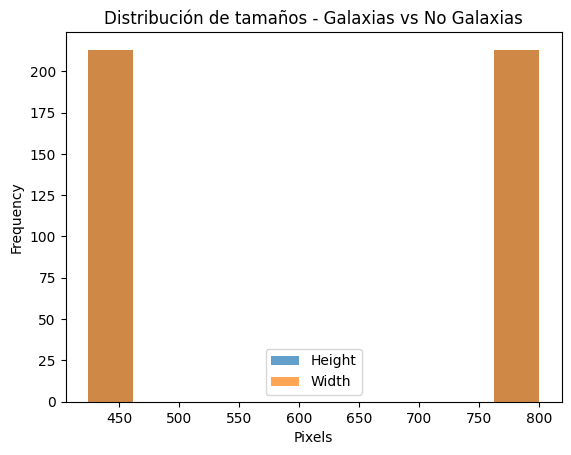


Entrenando modelo para Galaxias vs No Galaxias con histogram_equalization y Cross-Validation...

Fold 1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


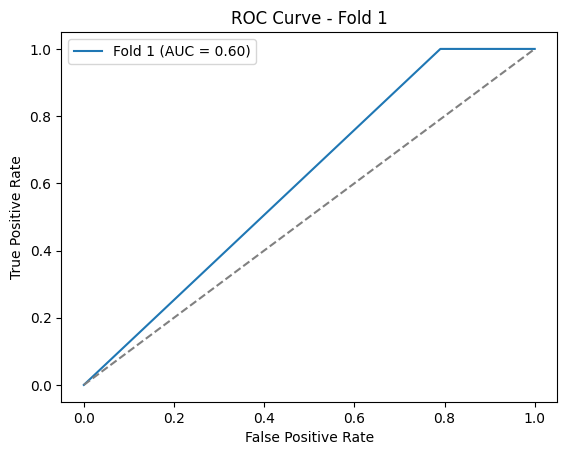


Fold 2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


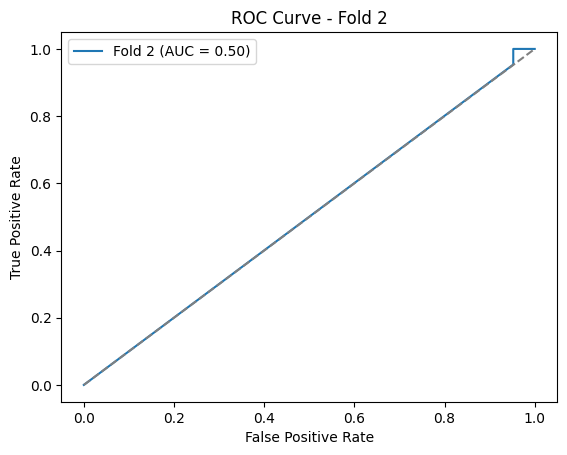


Fold 3


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


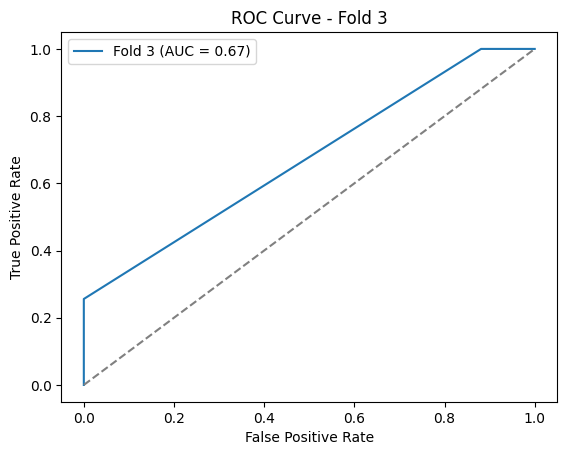


Fold 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


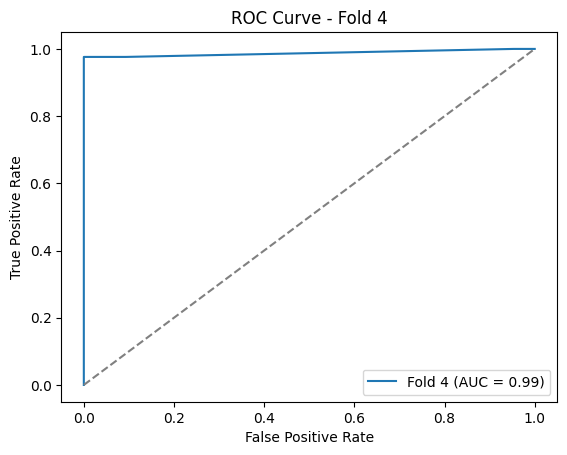


Fold 5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


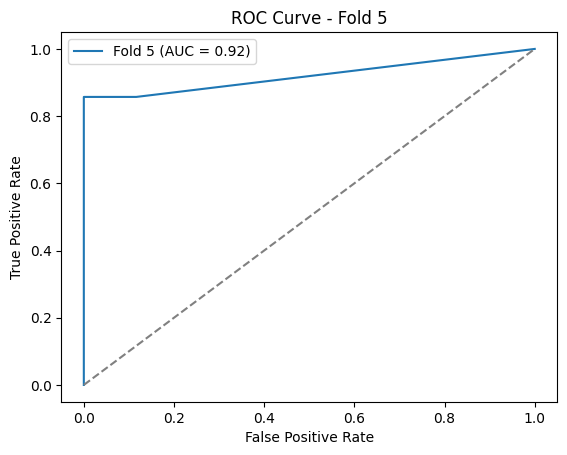


Promedio AUC para Galaxias vs No Galaxias (histogram_equalization): 0.74

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.69      0.84      0.76       213
           1       0.79      0.62      0.69       213

    accuracy                           0.73       426
   macro avg       0.74      0.73      0.72       426
weighted avg       0.74      0.73      0.72       426



In [ ]:
# Importar bibliotecas
import os
import cv2
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

# Parámetros globales
TARGET_SIZE = (128, 128)

# Técnica de preprocesamiento seleccionada
def histogram_equalization(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(grayscale, TARGET_SIZE)
    return cv2.equalizeHist(resized)

# Cargar imágenes con etiquetas
def load_images(image_path, label):
    images = []
    labels = []
    for img_name in os.listdir(image_path):
        img_path = os.path.join(image_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar la imagen: {img_path}")
            continue
        images.append(img)
        labels.append(label)
    return images, labels

# Crear modelo CNN
def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Clasificación binaria
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# EDA
def perform_eda(image_paths, labels, label_name):
    image_sizes = [img.shape[:2] for img in image_paths]
    unique_sizes = set(image_sizes)
    print(f"\nEDA para {label_name}:")
    print(f"Total de imágenes: {len(image_paths)}")
    print(f"Tamaños únicos: {unique_sizes}")
    plt.hist([size[0] for size in image_sizes], bins=10, alpha=0.7, label='Height')
    plt.hist([size[1] for size in image_sizes], bins=10, alpha=0.7, label='Width')
    plt.xlabel("Pixels")
    plt.ylabel("Frequency")
    plt.title(f"Distribución de tamaños - {label_name}")
    plt.legend()
    plt.show()

# Entrenar y evaluar modelo con Cross-Validation
def train_model_with_histogram_equalization(images, labels, label_name):
    print(f"\nEntrenando modelo para {label_name} con histogram_equalization y Cross-Validation...")

    # Aplicar preprocesamiento con histogram_equalization
    preprocess_fn = histogram_equalization
    X = np.array([preprocess_fn(img) for img in images])
    y = np.array(labels)

    # Expandir dimensión si las imágenes son en escala de grises
    if len(X.shape) == 3:
        X = X[..., np.newaxis]

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    all_y_true, all_y_pred = [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\nFold {fold + 1}")

        # Dividir en entrenamiento y validación
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # Crear modelo CNN
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))

        # Entrenar modelo
        model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=0)

        # Predicciones y métricas
        y_pred_prob = model.predict(X_val).ravel()
        y_pred = (y_pred_prob > 0.5).astype(int)
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)

        # Calcular curva ROC y AUC
        fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)

        # Graficar curva ROC
        plt.figure()
        plt.plot(fpr, tpr, label=f"Fold {fold + 1} (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.title(f"ROC Curve - Fold {fold + 1}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.show()

    # Promedio AUC
    avg_auc = np.mean(auc_scores)
    print(f"\nPromedio AUC para {label_name} (histogram_equalization): {avg_auc:.2f}")

    # Reporte de clasificación final
    print("\nReporte de Clasificación:")
    print(classification_report(all_y_true, all_y_pred))

# Galaxias vs No Galaxias
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Cargar imágenes y etiquetas
galaxy_images, galaxy_labels = load_images(GALAXY_PATH, 1)
dwarf_images, dwarf_labels = load_images(DWARF_PATH, 0)

# Combinar datos
all_images = galaxy_images + dwarf_images
all_labels = galaxy_labels + dwarf_labels

# EDA
perform_eda(all_images, all_labels, "Galaxias vs No Galaxias")

# Entrenar modelo usando histogram_equalization
train_model_with_histogram_equalization(all_images, all_labels, "Galaxias vs No Galaxias")



EDA para Galaxias vs No Galaxias:
Total de imágenes: 426
Tamaños únicos: {(424, 424), (800, 800)}


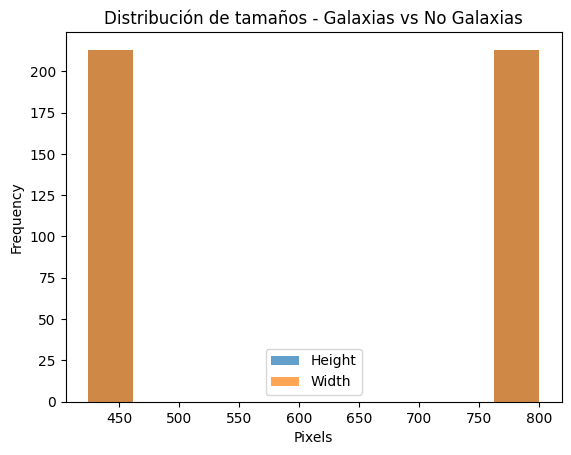


Entrenando modelo para Galaxias vs No Galaxias con resize_and_normalize y Cross-Validation...

Fold 1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


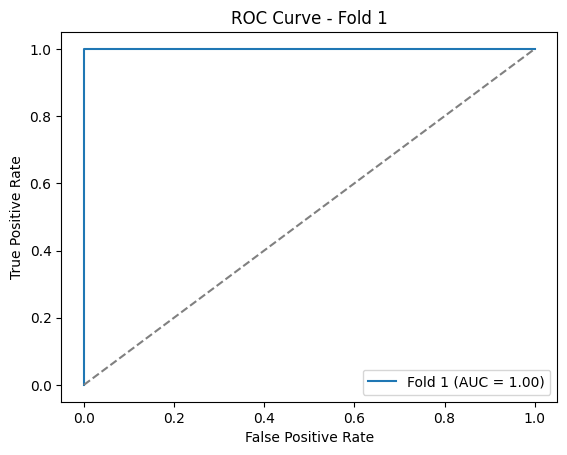


Fold 2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


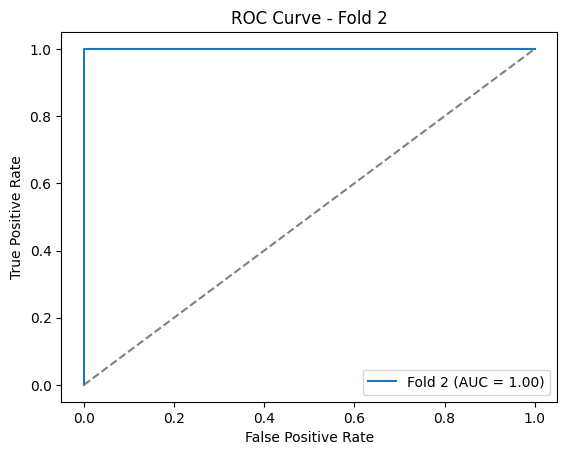


Fold 3


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


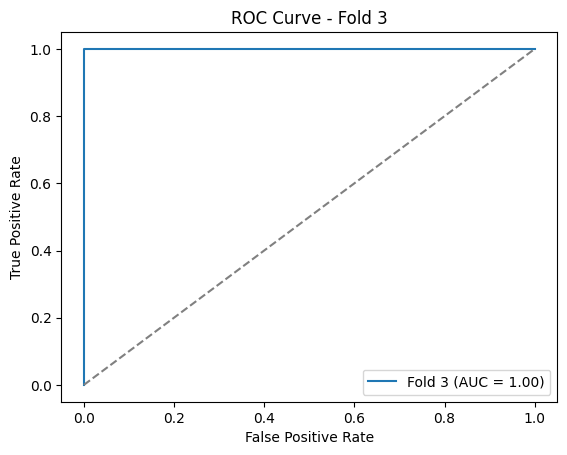


Fold 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


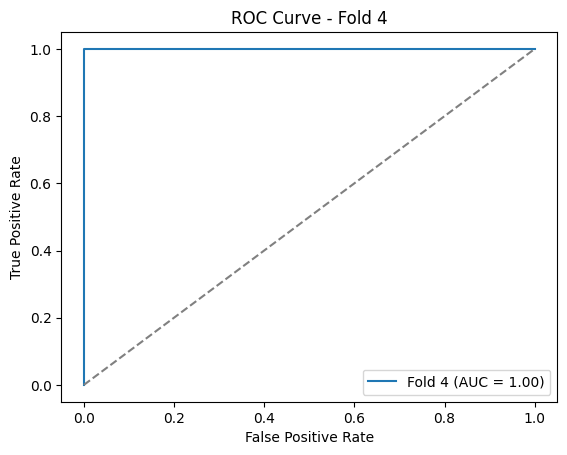


Fold 5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


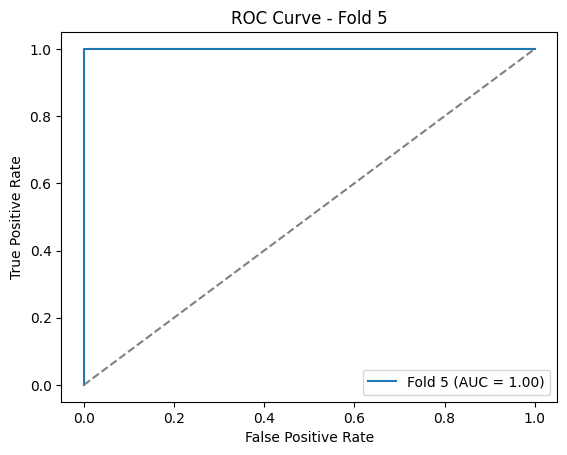


Promedio AUC para Galaxias vs No Galaxias (resize_and_normalize): 1.00

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       213
           1       1.00      1.00      1.00       213

    accuracy                           1.00       426
   macro avg       1.00      1.00      1.00       426
weighted avg       1.00      1.00      1.00       426



In [ ]:


# Importar bibliotecas
import os
import cv2
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

# Parámetros globales
TARGET_SIZE = (128, 128)

# Técnica de preprocesamiento seleccionada
def resize_and_normalize(image):
    resized = cv2.resize(image, TARGET_SIZE)
    return resized / 255.0

# Cargar imágenes con etiquetas
def load_images(image_path, label):
    images = []
    labels = []
    for img_name in os.listdir(image_path):
        img_path = os.path.join(image_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar la imagen: {img_path}")
            continue
        images.append(img)
        labels.append(label)
    return images, labels

# Crear modelo CNN
def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Clasificación binaria
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# EDA
def perform_eda(image_paths, labels, label_name):
    image_sizes = [img.shape[:2] for img in image_paths]
    unique_sizes = set(image_sizes)
    print(f"\nEDA para {label_name}:")
    print(f"Total de imágenes: {len(image_paths)}")
    print(f"Tamaños únicos: {unique_sizes}")
    plt.hist([size[0] for size in image_sizes], bins=10, alpha=0.7, label='Height')
    plt.hist([size[1] for size in image_sizes], bins=10, alpha=0.7, label='Width')
    plt.xlabel("Pixels")
    plt.ylabel("Frequency")
    plt.title(f"Distribución de tamaños - {label_name}")
    plt.legend()
    plt.show()

# Entrenar y evaluar modelo con Cross-Validation
def train_model_with_histogram_equalization(images, labels, label_name):
    print(f"\nEntrenando modelo para {label_name} con resize_and_normalize y Cross-Validation...")

    # Aplicar preprocesamiento con resize_and_normalize
    preprocess_fn = resize_and_normalize
    X = np.array([preprocess_fn(img) for img in images])
    y = np.array(labels)

    # Expandir dimensión si las imágenes son en escala de grises
    if len(X.shape) == 3:
        X = X[..., np.newaxis]

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    all_y_true, all_y_pred = [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\nFold {fold + 1}")

        # Dividir en entrenamiento y validación
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # Crear modelo CNN
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))

        # Entrenar modelo
        model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=0)

        # Predicciones y métricas
        y_pred_prob = model.predict(X_val).ravel()
        y_pred = (y_pred_prob > 0.5).astype(int)
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)

        # Calcular curva ROC y AUC
        fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)

        # Graficar curva ROC
        plt.figure()
        plt.plot(fpr, tpr, label=f"Fold {fold + 1} (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.title(f"ROC Curve - Fold {fold + 1}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.show()

    # Promedio AUC
    avg_auc = np.mean(auc_scores)
    print(f"\nPromedio AUC para {label_name} (resize_and_normalize): {avg_auc:.2f}")

    # Reporte de clasificación final
    print("\nReporte de Clasificación:")
    print(classification_report(all_y_true, all_y_pred))

# Galaxias vs No Galaxias
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Cargar imágenes y etiquetas
galaxy_images, galaxy_labels = load_images(GALAXY_PATH, 1)
dwarf_images, dwarf_labels = load_images(DWARF_PATH, 0)

# Combinar datos
all_images = galaxy_images + dwarf_images
all_labels = galaxy_labels + dwarf_labels

# EDA
perform_eda(all_images, all_labels, "Galaxias vs No Galaxias")

# Entrenar modelo usando histogram_equalization
train_model_with_histogram_equalization(all_images, all_labels, "Galaxias vs No Galaxias")



EDA para Galaxias vs No Galaxias:
Total de imágenes: 426
Tamaños únicos: {(424, 424), (800, 800)}


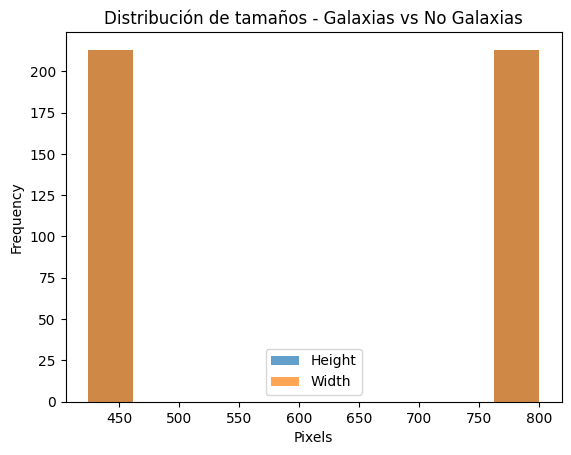


Entrenando modelo para Galaxias vs No Galaxias con convert_to_grayscale y Cross-Validation...

Fold 1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


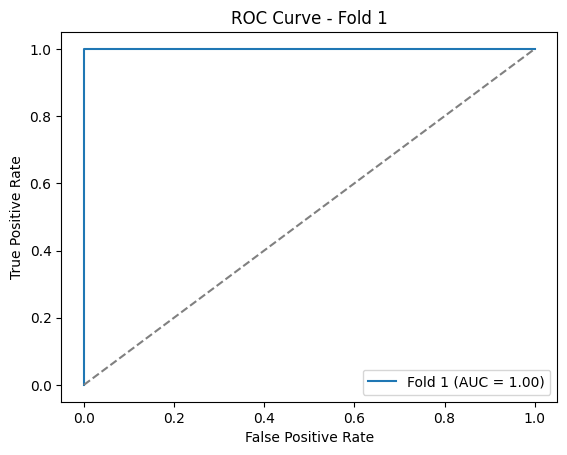


Fold 2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


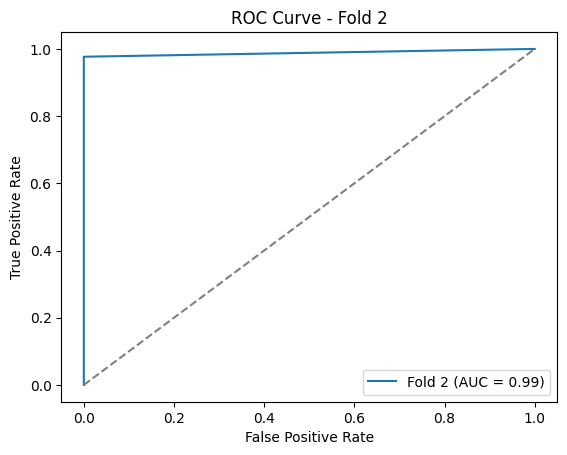


Fold 3


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


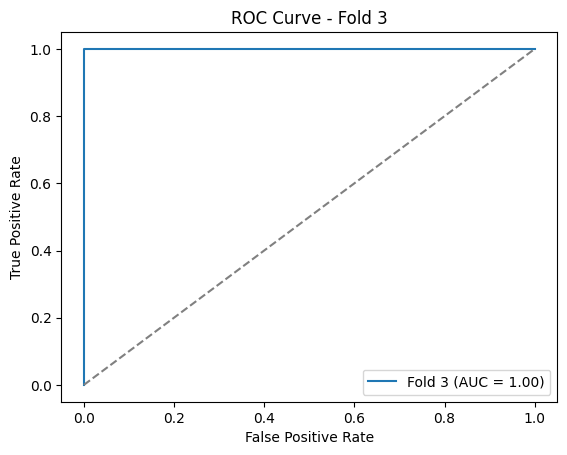


Fold 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step


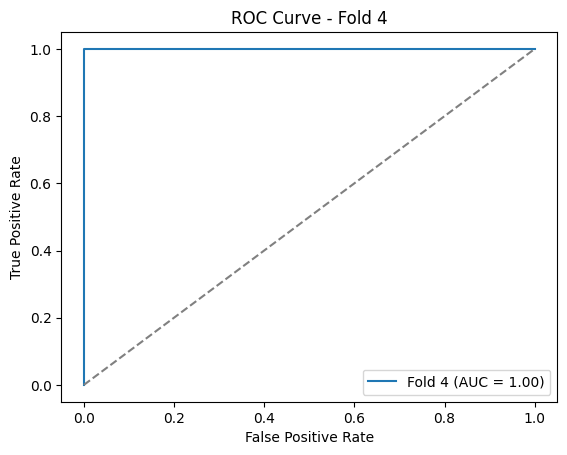


Fold 5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


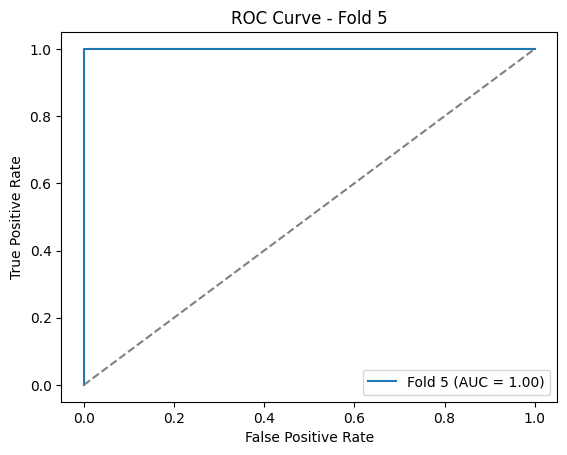


Promedio AUC para Galaxias vs No Galaxias (convert_to_grayscale): 1.00

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       213
           1       1.00      1.00      1.00       213

    accuracy                           1.00       426
   macro avg       1.00      1.00      1.00       426
weighted avg       1.00      1.00      1.00       426



In [ ]:


# Importar bibliotecas
import os
import cv2
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

# Parámetros globales
TARGET_SIZE = (128, 128)

# Técnica de preprocesamiento seleccionada
def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, TARGET_SIZE)

# Cargar imágenes con etiquetas
def load_images(image_path, label):
    images = []
    labels = []
    for img_name in os.listdir(image_path):
        img_path = os.path.join(image_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar la imagen: {img_path}")
            continue
        images.append(img)
        labels.append(label)
    return images, labels

# Crear modelo CNN
def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Clasificación binaria
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# EDA
def perform_eda(image_paths, labels, label_name):
    image_sizes = [img.shape[:2] for img in image_paths]
    unique_sizes = set(image_sizes)
    print(f"\nEDA para {label_name}:")
    print(f"Total de imágenes: {len(image_paths)}")
    print(f"Tamaños únicos: {unique_sizes}")
    plt.hist([size[0] for size in image_sizes], bins=10, alpha=0.7, label='Height')
    plt.hist([size[1] for size in image_sizes], bins=10, alpha=0.7, label='Width')
    plt.xlabel("Pixels")
    plt.ylabel("Frequency")
    plt.title(f"Distribución de tamaños - {label_name}")
    plt.legend()
    plt.show()

# Entrenar y evaluar modelo con Cross-Validation
def train_model_with_histogram_equalization(images, labels, label_name):
    print(f"\nEntrenando modelo para {label_name} con convert_to_grayscale y Cross-Validation...")

    # Aplicar preprocesamiento con convert_to_grayscale
    preprocess_fn = convert_to_grayscale
    X = np.array([preprocess_fn(img) for img in images])
    y = np.array(labels)

    # Expandir dimensión si las imágenes son en escala de grises
    if len(X.shape) == 3:
        X = X[..., np.newaxis]

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    all_y_true, all_y_pred = [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\nFold {fold + 1}")

        # Dividir en entrenamiento y validación
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # Crear modelo CNN
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))

        # Entrenar modelo
        model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=0)

        # Predicciones y métricas
        y_pred_prob = model.predict(X_val).ravel()
        y_pred = (y_pred_prob > 0.5).astype(int)
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)

        # Calcular curva ROC y AUC
        fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)

        # Graficar curva ROC
        plt.figure()
        plt.plot(fpr, tpr, label=f"Fold {fold + 1} (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.title(f"ROC Curve - Fold {fold + 1}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.show()

    # Promedio AUC
    avg_auc = np.mean(auc_scores)
    print(f"\nPromedio AUC para {label_name} (convert_to_grayscale): {avg_auc:.2f}")

    # Reporte de clasificación final
    print("\nReporte de Clasificación:")
    print(classification_report(all_y_true, all_y_pred))

# Galaxias vs No Galaxias
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Cargar imágenes y etiquetas
galaxy_images, galaxy_labels = load_images(GALAXY_PATH, 1)
dwarf_images, dwarf_labels = load_images(DWARF_PATH, 0)

# Combinar datos
all_images = galaxy_images + dwarf_images
all_labels = galaxy_labels + dwarf_labels

# EDA
perform_eda(all_images, all_labels, "Galaxias vs No Galaxias")

# Entrenar modelo usando histogram_equalization
train_model_with_histogram_equalization(all_images, all_labels, "Galaxias vs No Galaxias")



EDA para Galaxias vs No Galaxias:
Total de imágenes: 426
Tamaños únicos: {(424, 424), (800, 800)}


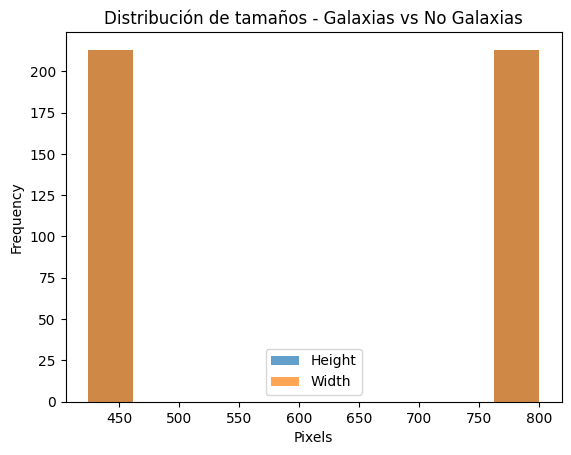


Entrenando modelo para Galaxias vs No Galaxias con gaussian_blur( y Cross-Validation...

Fold 1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


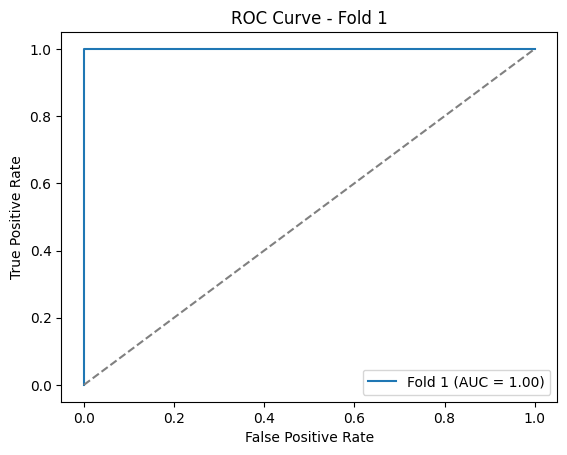


Fold 2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


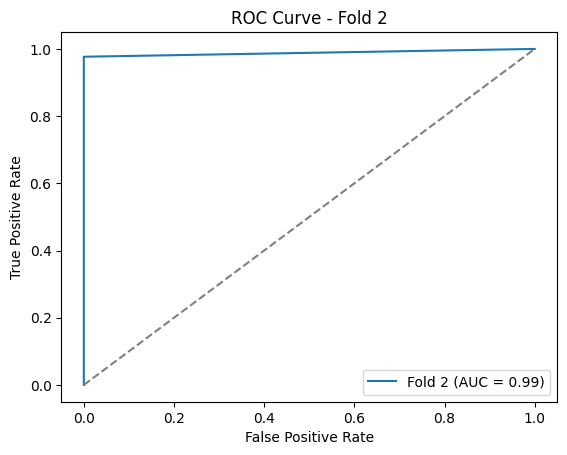


Fold 3


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


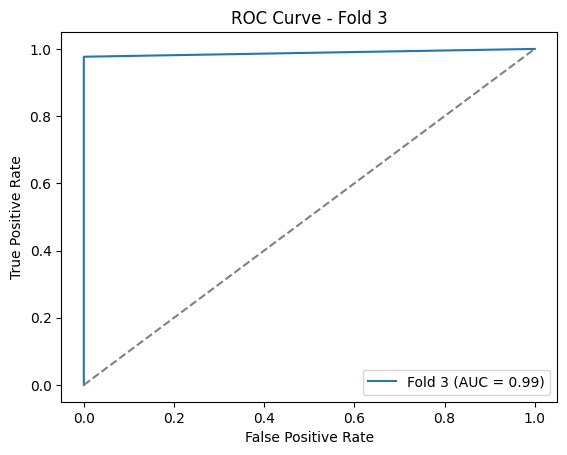


Fold 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step


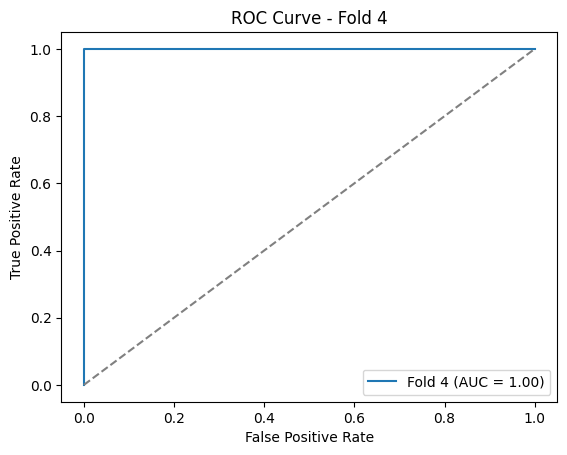


Fold 5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step


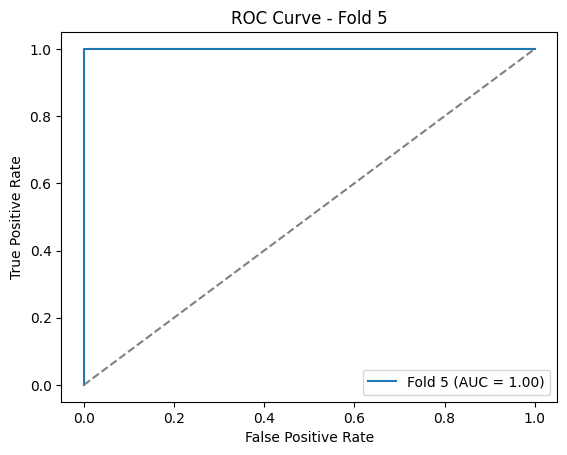


Promedio AUC para Galaxias vs No Galaxias (gaussian_blur(): 1.00

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       213
           1       1.00      0.99      1.00       213

    accuracy                           1.00       426
   macro avg       1.00      1.00      1.00       426
weighted avg       1.00      1.00      1.00       426



In [ ]:


# Importar bibliotecas
import os
import cv2
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

# Parámetros globales
TARGET_SIZE = (128, 128)

# Técnica de preprocesamiento seleccionada
def gaussian_blur(image):
    return cv2.GaussianBlur(cv2.resize(image, TARGET_SIZE), (5, 5), 0)

# Cargar imágenes con etiquetas
def load_images(image_path, label):
    images = []
    labels = []
    for img_name in os.listdir(image_path):
        img_path = os.path.join(image_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar la imagen: {img_path}")
            continue
        images.append(img)
        labels.append(label)
    return images, labels

# Crear modelo CNN
def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Clasificación binaria
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# EDA
def perform_eda(image_paths, labels, label_name):
    image_sizes = [img.shape[:2] for img in image_paths]
    unique_sizes = set(image_sizes)
    print(f"\nEDA para {label_name}:")
    print(f"Total de imágenes: {len(image_paths)}")
    print(f"Tamaños únicos: {unique_sizes}")
    plt.hist([size[0] for size in image_sizes], bins=10, alpha=0.7, label='Height')
    plt.hist([size[1] for size in image_sizes], bins=10, alpha=0.7, label='Width')
    plt.xlabel("Pixels")
    plt.ylabel("Frequency")
    plt.title(f"Distribución de tamaños - {label_name}")
    plt.legend()
    plt.show()

# Entrenar y evaluar modelo con Cross-Validation
def train_model_with_histogram_equalization(images, labels, label_name):
    print(f"\nEntrenando modelo para {label_name} con gaussian_blur( y Cross-Validation...")

    # Aplicar preprocesamiento con gaussian_blur(
    preprocess_fn = gaussian_blur
    X = np.array([preprocess_fn(img) for img in images])
    y = np.array(labels)

    # Expandir dimensión si las imágenes son en escala de grises
    if len(X.shape) == 3:
        X = X[..., np.newaxis]

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    all_y_true, all_y_pred = [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\nFold {fold + 1}")

        # Dividir en entrenamiento y validación
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # Crear modelo CNN
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))

        # Entrenar modelo
        model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=0)

        # Predicciones y métricas
        y_pred_prob = model.predict(X_val).ravel()
        y_pred = (y_pred_prob > 0.5).astype(int)
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)

        # Calcular curva ROC y AUC
        fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)

        # Graficar curva ROC
        plt.figure()
        plt.plot(fpr, tpr, label=f"Fold {fold + 1} (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.title(f"ROC Curve - Fold {fold + 1}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.show()

    # Promedio AUC
    avg_auc = np.mean(auc_scores)
    print(f"\nPromedio AUC para {label_name} (gaussian_blur(): {avg_auc:.2f}")

    # Reporte de clasificación final
    print("\nReporte de Clasificación:")
    print(classification_report(all_y_true, all_y_pred))

# Galaxias vs No Galaxias
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Cargar imágenes y etiquetas
galaxy_images, galaxy_labels = load_images(GALAXY_PATH, 1)
dwarf_images, dwarf_labels = load_images(DWARF_PATH, 0)

# Combinar datos
all_images = galaxy_images + dwarf_images
all_labels = galaxy_labels + dwarf_labels

# EDA
perform_eda(all_images, all_labels, "Galaxias vs No Galaxias")

# Entrenar modelo usando histogram_equalization
train_model_with_histogram_equalization(all_images, all_labels, "Galaxias vs No Galaxias")



Técnica de preprocesamiento: resize_normalize


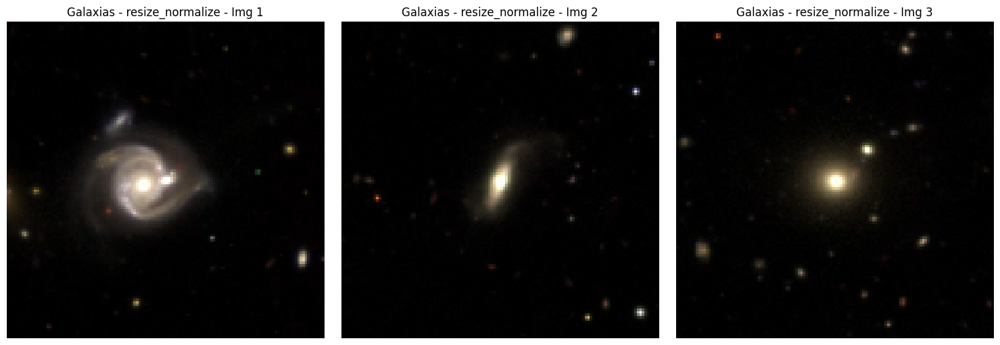

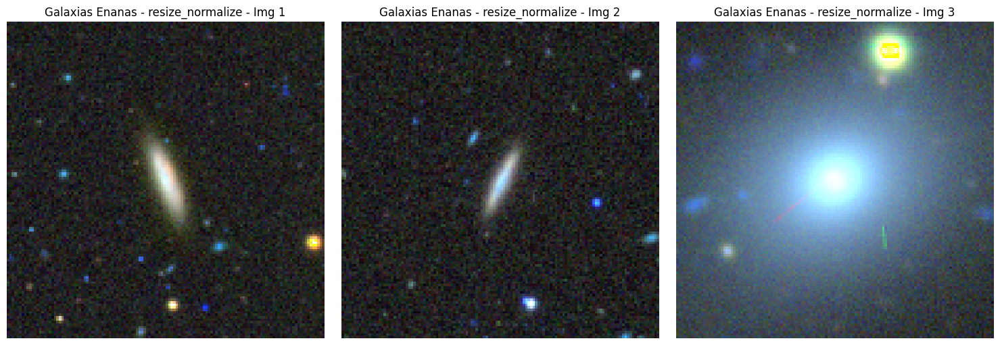


Técnica de preprocesamiento: grayscale


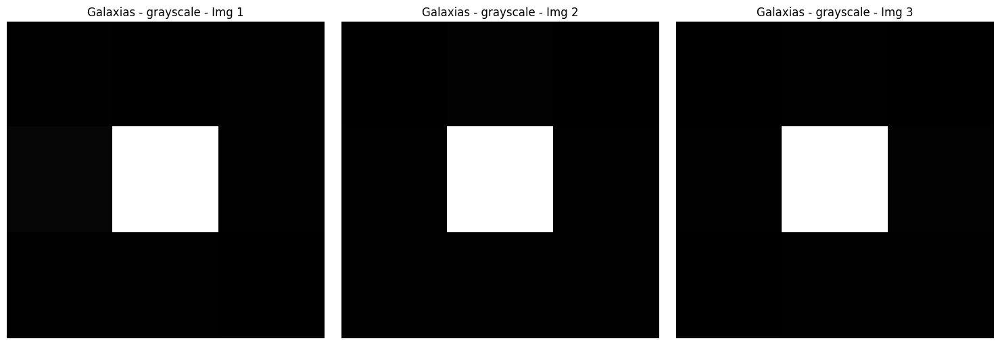

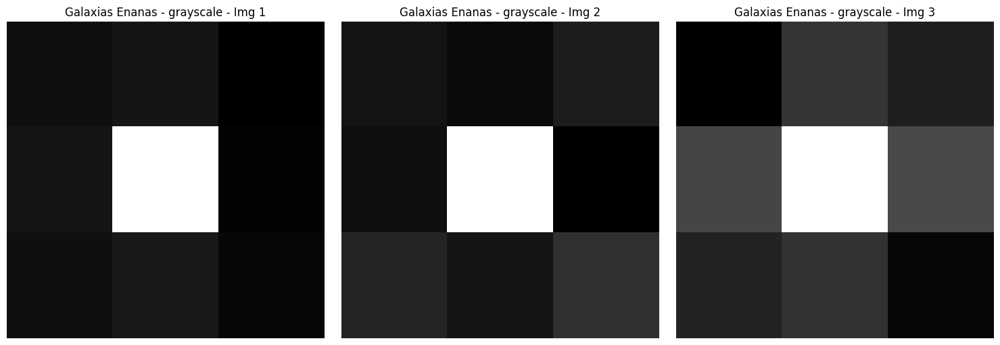


Técnica de preprocesamiento: histogram_equalization


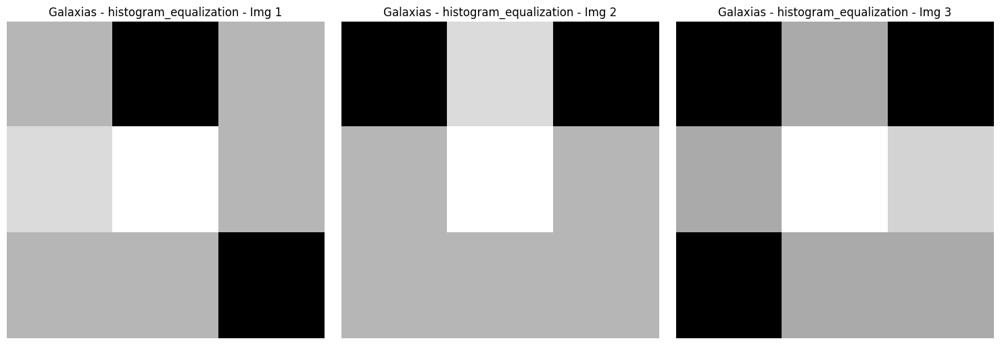

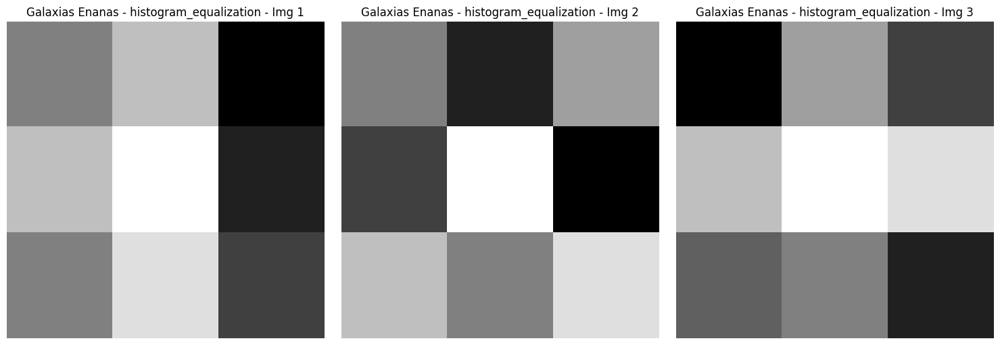


Técnica de preprocesamiento: gaussian_blur


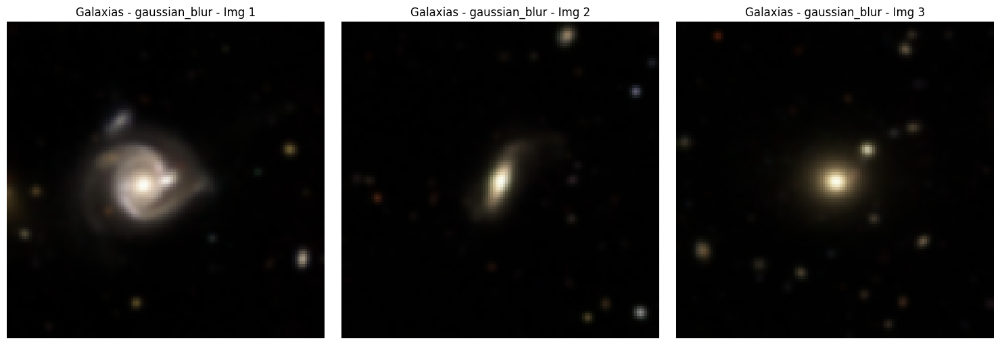

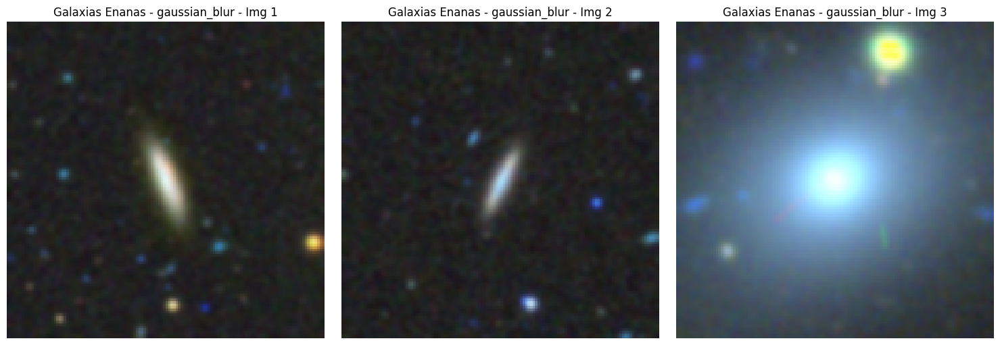

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Rutas de las carpetas
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Seleccionar 3 imágenes de cada carpeta
def select_images(image_path, max_images=3):
    image_files = [f for f in os.listdir(image_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    selected_files = image_files[:max_images]
    return [os.path.join(image_path, img) for img in selected_files]

# Técnicas de preprocesamiento
def resize_and_normalize(image):
    resized = cv2.resize(image, (128, 128))
    return resized / 255.0

def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, (3, 3))

def histogram_equalization(image):
    grayscale = convert_to_grayscale(image)
    return cv2.equalizeHist(grayscale)

def gaussian_blur(image):
    return cv2.GaussianBlur(cv2.resize(image, (128, 128)), (5, 5), 0)

# Mapear técnicas de preprocesamiento
PREPROCESSING_TECHNIQUES = {
    "resize_normalize": resize_and_normalize,
    "grayscale": convert_to_grayscale,
    "histogram_equalization": histogram_equalization,
    "gaussian_blur": gaussian_blur,
}

# Cargar y procesar imágenes
def load_and_process_images(image_paths, preprocess_fn):
    processed_images = []
    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is not None:
            processed_images.append(preprocess_fn(img))
    return processed_images

# Visualizar imágenes preprocesadas
def visualize_images(processed_images, technique_name, label):
    plt.figure(figsize=(15, 5))
    for i, img in enumerate(processed_images):
        plt.subplot(1, len(processed_images), i + 1)
        if len(img.shape) == 2:  # Grayscale
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img)
        plt.title(f"{label} - {technique_name} - Img {i + 1}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Seleccionar imágenes de cada carpeta
galaxy_images = select_images(GALAXY_PATH)
dwarf_images = select_images(DWARF_PATH)

# Aplicar y visualizar técnicas de preprocesamiento
for technique_name, preprocess_fn in PREPROCESSING_TECHNIQUES.items():
    print(f"\nTécnica de preprocesamiento: {technique_name}")

    # Procesar imágenes de galaxias
    processed_galaxy_images = load_and_process_images(galaxy_images, preprocess_fn)
    visualize_images(processed_galaxy_images, technique_name, "Galaxias")

    # Procesar imágenes de galaxias enanas
    processed_dwarf_images = load_and_process_images(dwarf_images, preprocess_fn)
    visualize_images(processed_dwarf_images, technique_name, "Galaxias Enanas")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Evaluando Galaxias...

Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-383_color.jpg


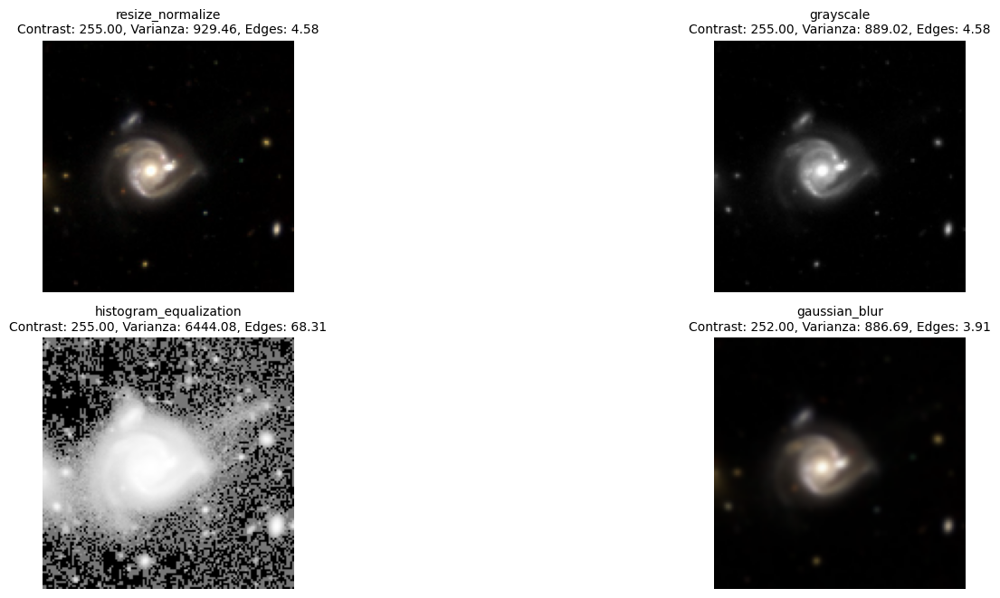


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-164_color.jpg


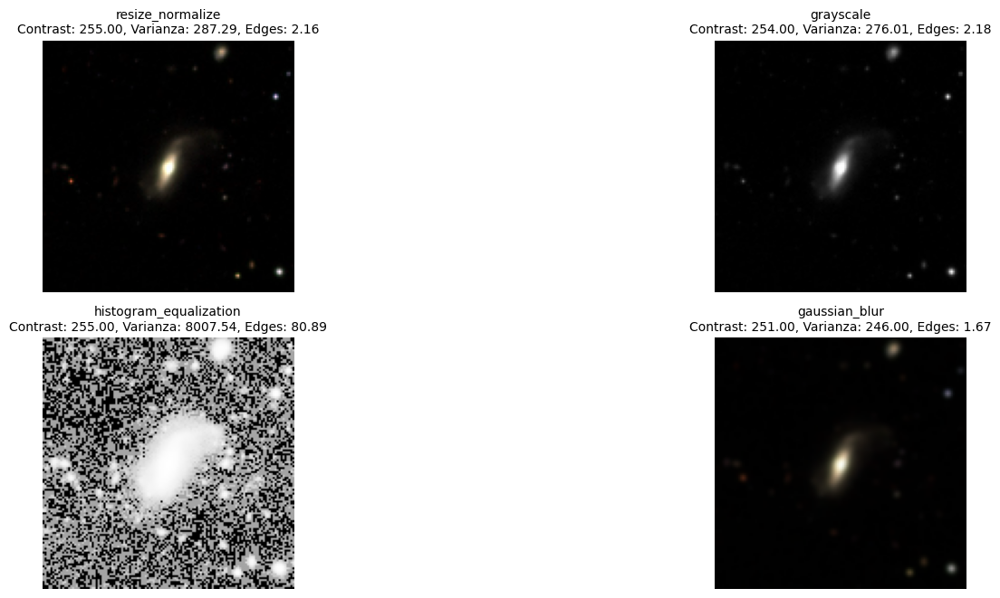


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-539_color.jpg


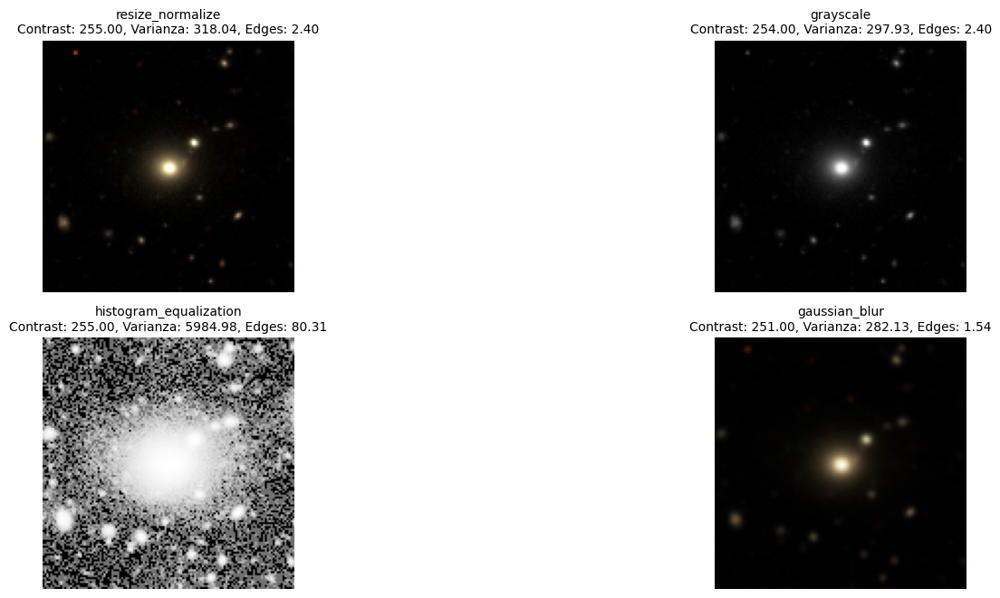


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W1-281_color.jpg


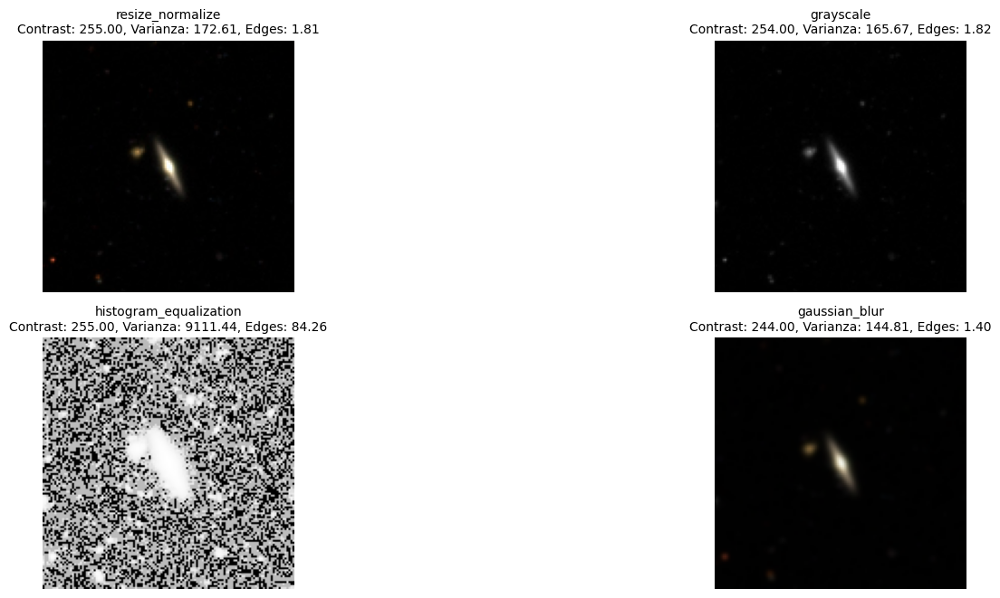


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-670_color.jpg


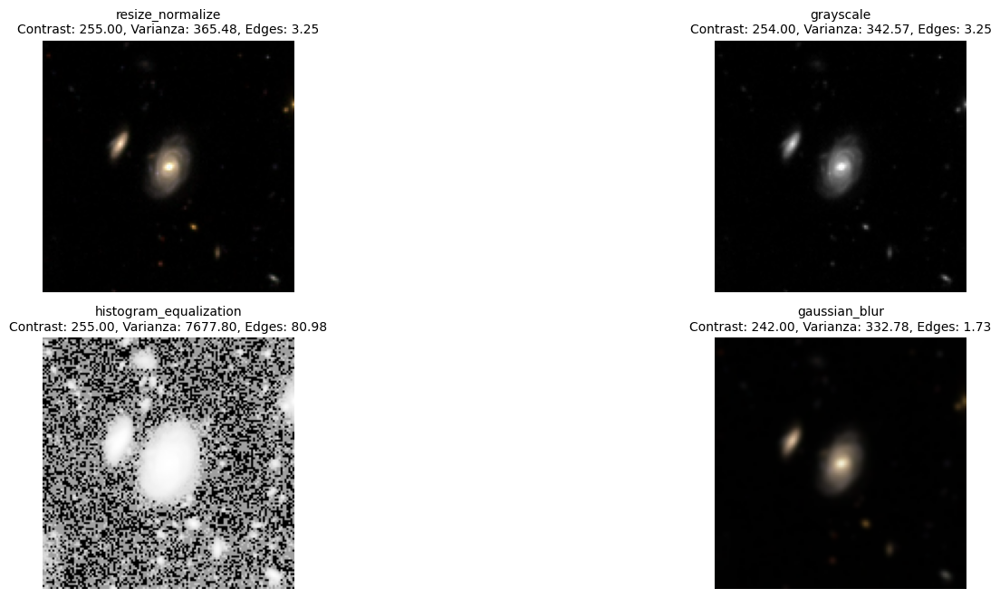


Evaluando Galaxias Enanas...

Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J160527.69+413856.0.jpg


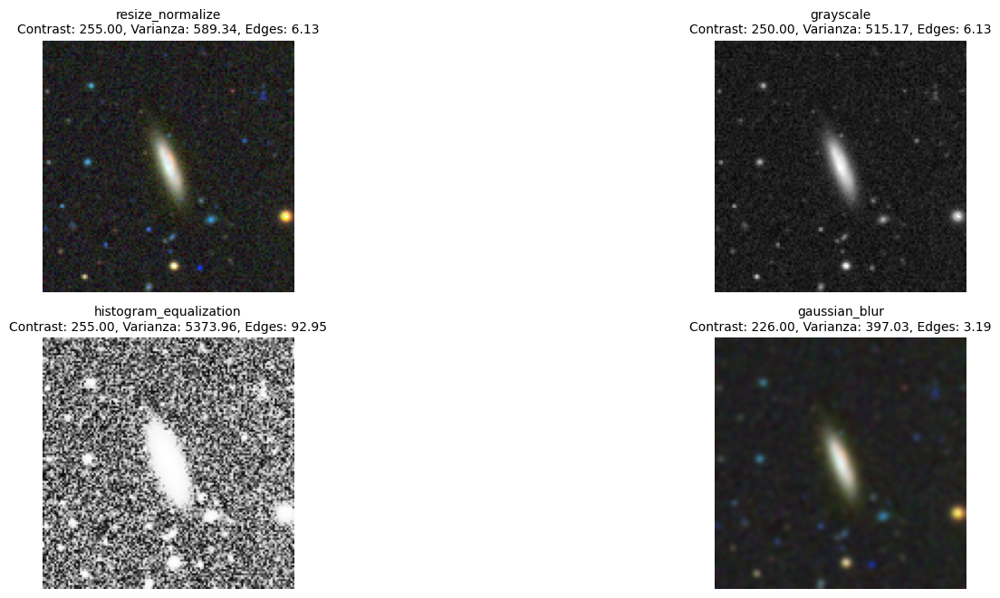


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J125346.63+272308.7.jpg


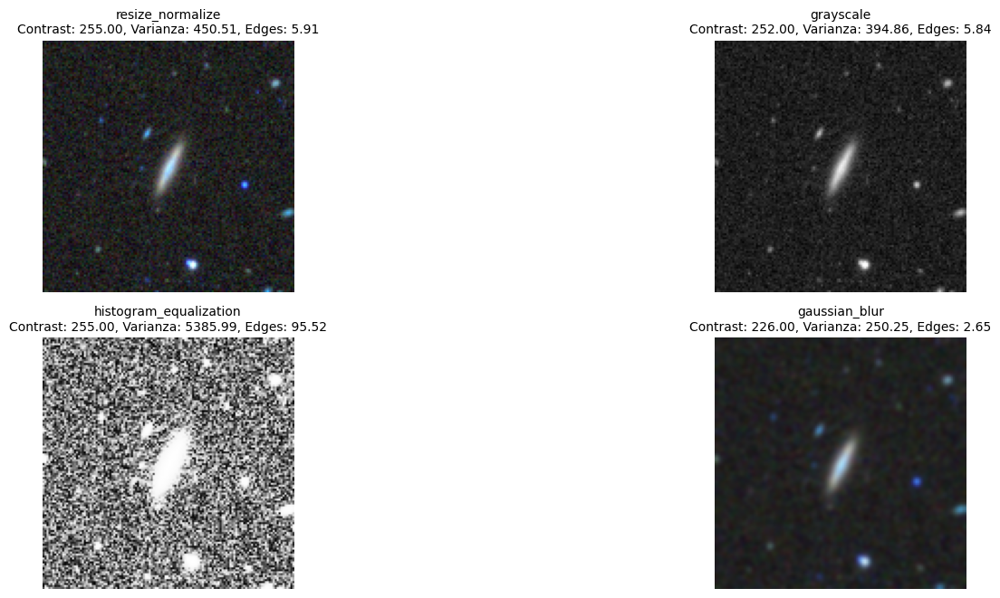


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J094405.01+004400.7.jpg


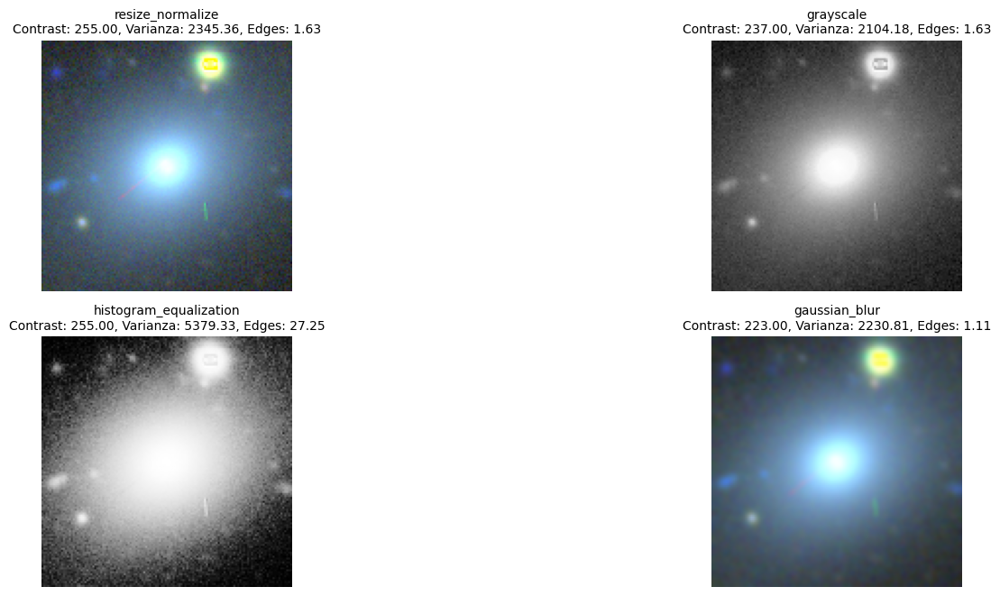


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J144029.40+032557.92.jpg


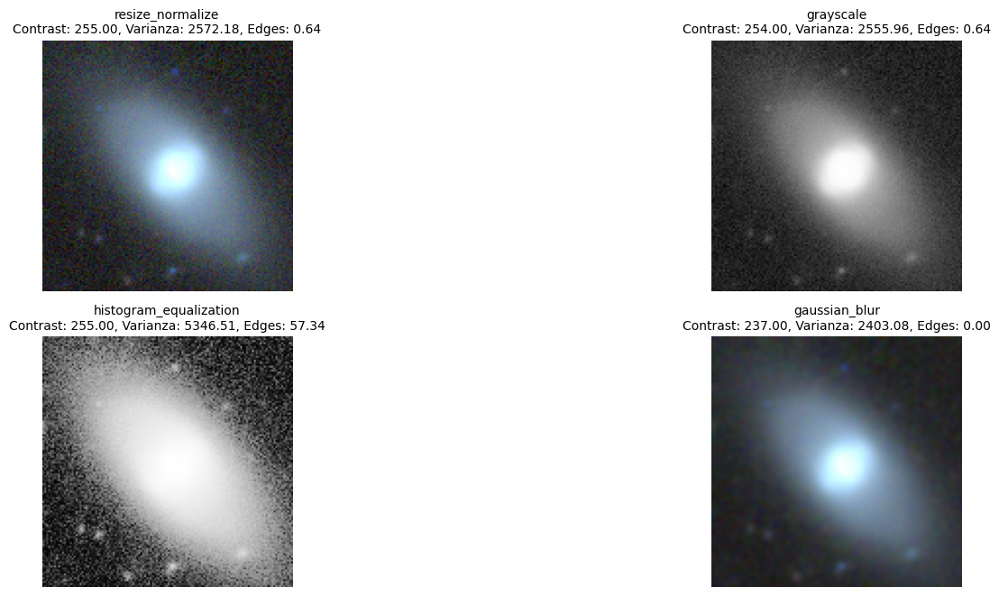


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J015859.65+005430.4.jpg


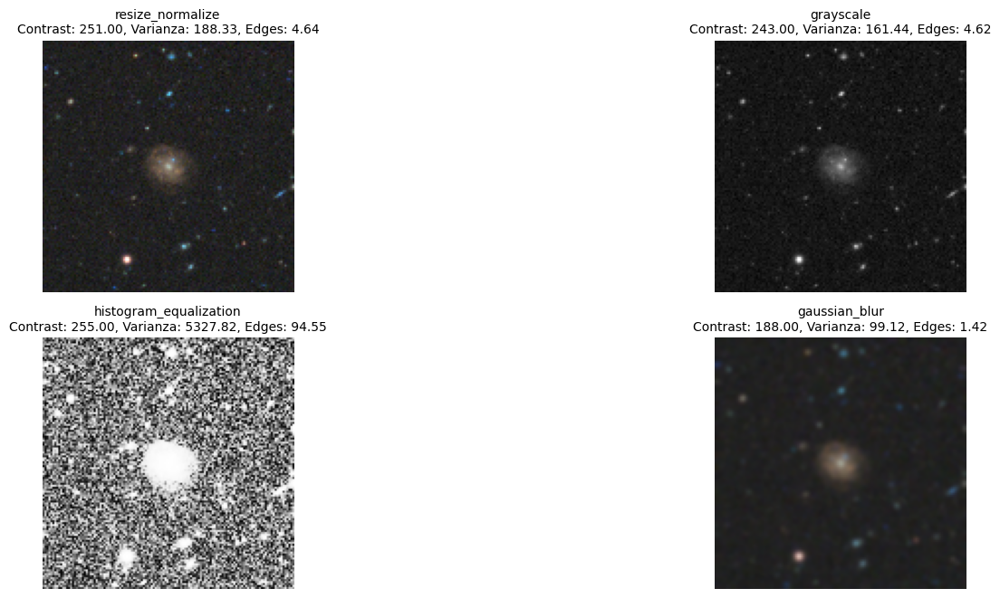

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Definir los paths de las carpetas
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Técnicas de preprocesamiento
def resize_and_normalize(image):
    resized = cv2.resize(image, (128, 128))
    normalized = resized / 255.0
    return (normalized * 255).astype(np.uint8)

def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, (128, 128)).astype(np.uint8)

def histogram_equalization(image):
    grayscale = convert_to_grayscale(image)
    return cv2.equalizeHist(grayscale).astype(np.uint8)

def gaussian_blur(image):
    blurred = cv2.GaussianBlur(cv2.resize(image, (128, 128)), (5, 5), 0)
    return blurred.astype(np.uint8)

# Mapear técnicas de preprocesamiento
preprocess_techniques = {
    "resize_normalize": resize_and_normalize,
    "grayscale": convert_to_grayscale,
    "histogram_equalization": histogram_equalization,
    "gaussian_blur": gaussian_blur,
}

# Cargar imagen
def load_image(image_path):
    return cv2.imread(image_path)

# Evaluar métricas
def evaluate_preprocessing(image, preprocess_fn):
    processed_image = preprocess_fn(image)

    # Calcular métricas
    contrast = processed_image.max() - processed_image.min()
    varianza = np.var(processed_image)

    # Densidad de bordes (Canny)
    if len(processed_image.shape) == 3:  # Convertir a escala de grises si es necesario
        gray_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = processed_image
    edges = cv2.Canny(gray_image, 100, 200)
    edge_density = np.sum(edges) / edges.size  # Densidad de bordes

    return contrast, varianza, edge_density, processed_image

# Visualizar resultados con métricas
def visualize_results(image_path, preprocess_techniques):
    original_image = load_image(image_path)
    plt.figure(figsize=(15, 10))

    for i, (technique_name, preprocess_fn) in enumerate(preprocess_techniques.items()):
        contrast, varianza, edge_density, processed_image = evaluate_preprocessing(original_image, preprocess_fn)

        plt.subplot(3, 2, i + 1)
        if len(processed_image.shape) == 2:  # Grayscale
            plt.imshow(processed_image, cmap='gray')
        else:
            plt.imshow(processed_image)
        plt.title(
            f"{technique_name}\nContrast: {contrast:.2f}, Varianza: {varianza:.2f}, Edges: {edge_density:.2f}",
            fontsize=10,
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Seleccionar 5 imágenes de cada carpeta
def select_images(image_path, max_images=5):
    image_files = [f for f in os.listdir(image_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    selected_files = image_files[:max_images]
    return [os.path.join(image_path, img) for img in selected_files]

# Evaluar y visualizar técnicas de preprocesamiento para varias imágenes
def visualize_preprocessing_for_folder(folder_path, label, preprocess_techniques, max_images=5):
    # Seleccionar imágenes
    image_paths = select_images(folder_path, max_images)
    for img_path in image_paths:
        print(f"\nEvaluando preprocesamiento para: {img_path}")
        visualize_results(img_path, preprocess_techniques)

# Visualizar técnicas para Galaxias y Galaxias Enanas
print("Evaluando Galaxias...")
visualize_preprocessing_for_folder(GALAXY_PATH, "Galaxias", preprocess_techniques)

print("\nEvaluando Galaxias Enanas...")
visualize_preprocessing_for_folder(DWARF_PATH, "Galaxias Enanas", preprocess_techniques)


Solución:

Optamos por usar técnicas de preprocesamiento combinadas: escalado a escala de grises (grayscale) y equalización de histograma (histogram equalization), que destacaron patrones importantes de las galaxias sin aumentar la dimensionalidad.

Resize and Normalize: Escala las imágenes a un tamaño uniforme de 128x128 píxeles y normaliza los valores de píxeles para mejorar la consistencia de los datos.

Grayscale: Convierte las imágenes a escala de grises, reduciendo la complejidad de los datos y enfocándose en las texturas relevantes.

Histogram Equalization: Mejora el contraste y resalta detalles importantes, ayudando a los modelos a identificar patrones clave.

Gaussian Blur: Suaviza las imágenes para reducir el ruido y mejorar la detección de bordes en las etapas posteriores.

La combinación de estas técnicas permite mejorar la calidad de los datos y optimizar el rendimiento del modelo.

Hemos decidido utilizar la combinacion de ***Grayscale y Histogram Equalization***.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Evaluando y guardando resultados para Galaxias...
Evaluando y guardando resultados para Galaxias Enanas...

Resultados de Preprocesamiento:
                                                Image               Technique  \
0   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...        resize_normalize   
1   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...               grayscale   
2   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...  histogram_equalization   
3   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...           gaussian_blur   
4   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...        resize_normalize   
5   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...               grayscale   
6   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...  histogram_equalization   
7   /content/drive/MyDrive/CNN/Sample_ISB_Image/W3...           gaussian_blur   
8 

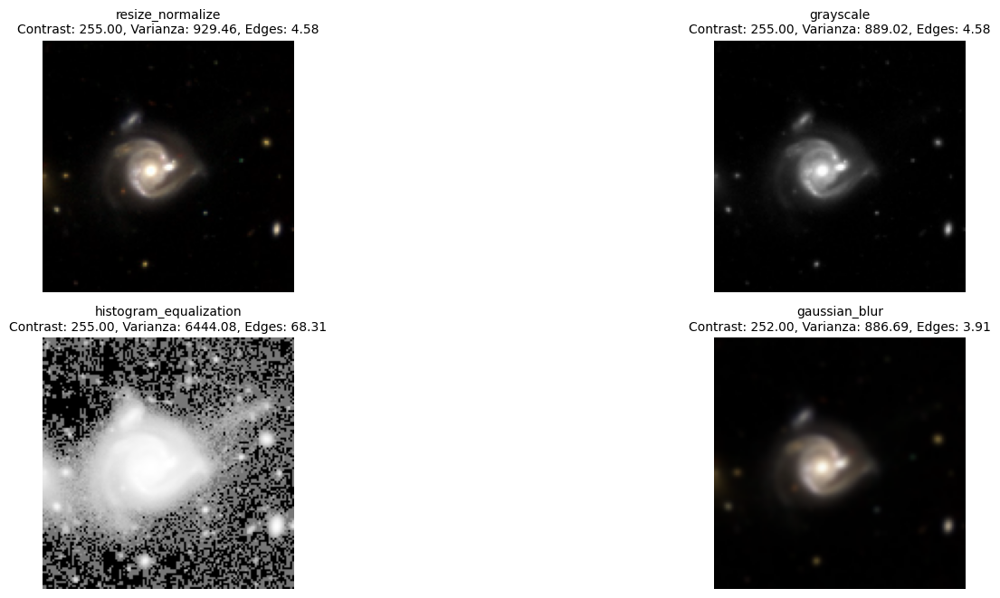


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-164_color.jpg


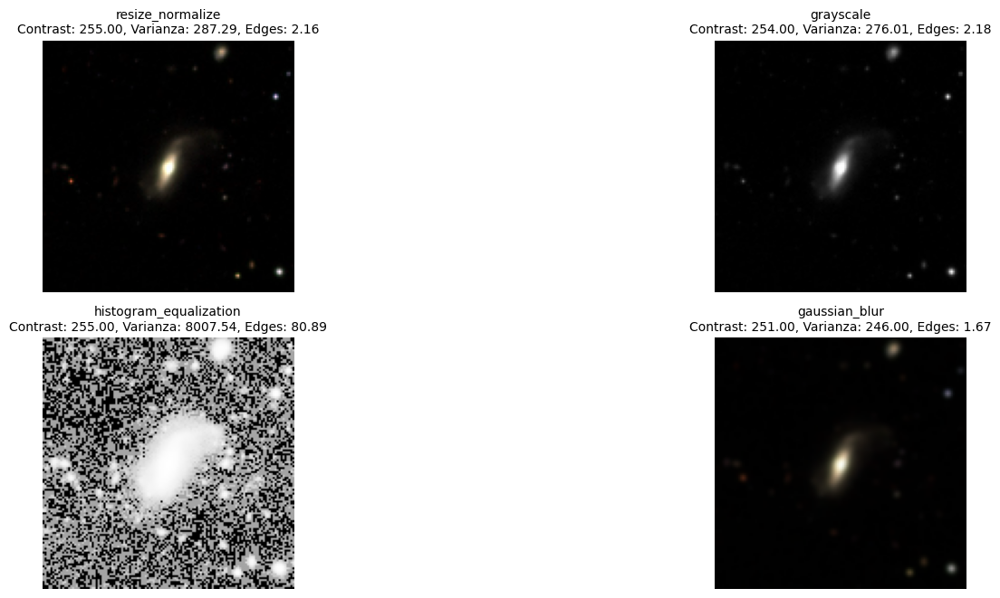


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-539_color.jpg


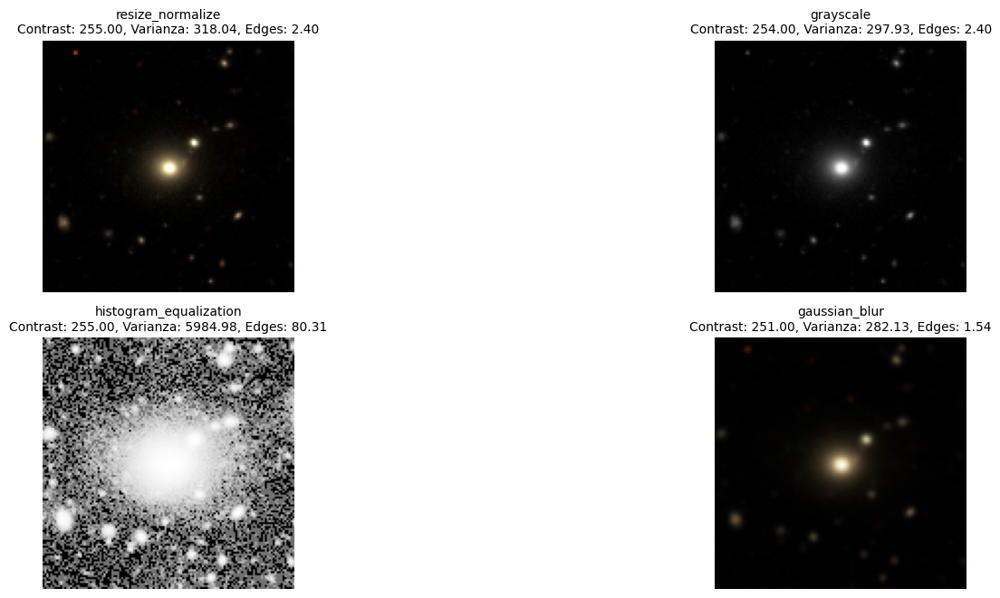


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W1-281_color.jpg


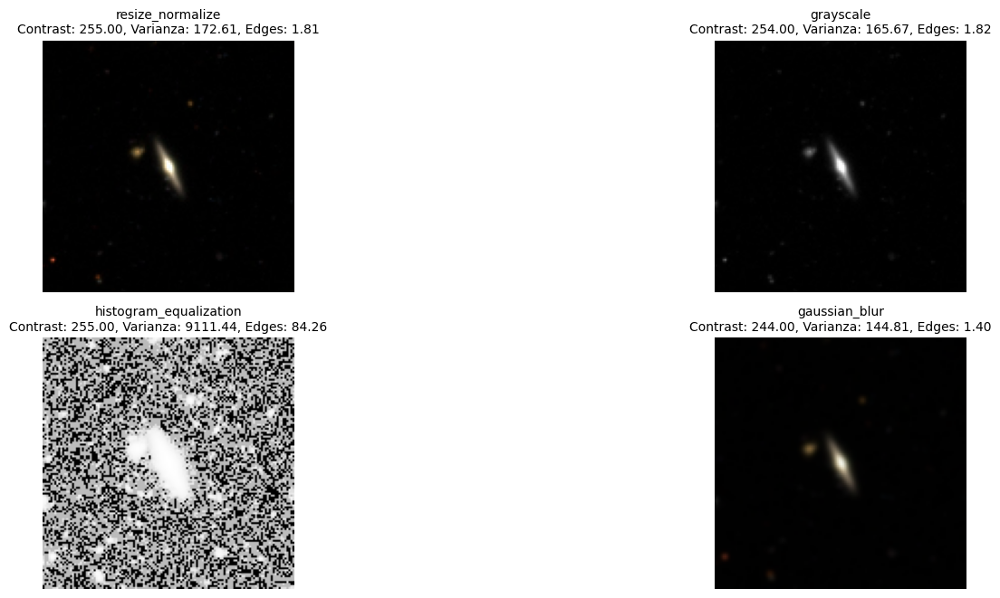


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_ISB_Image/W3-670_color.jpg


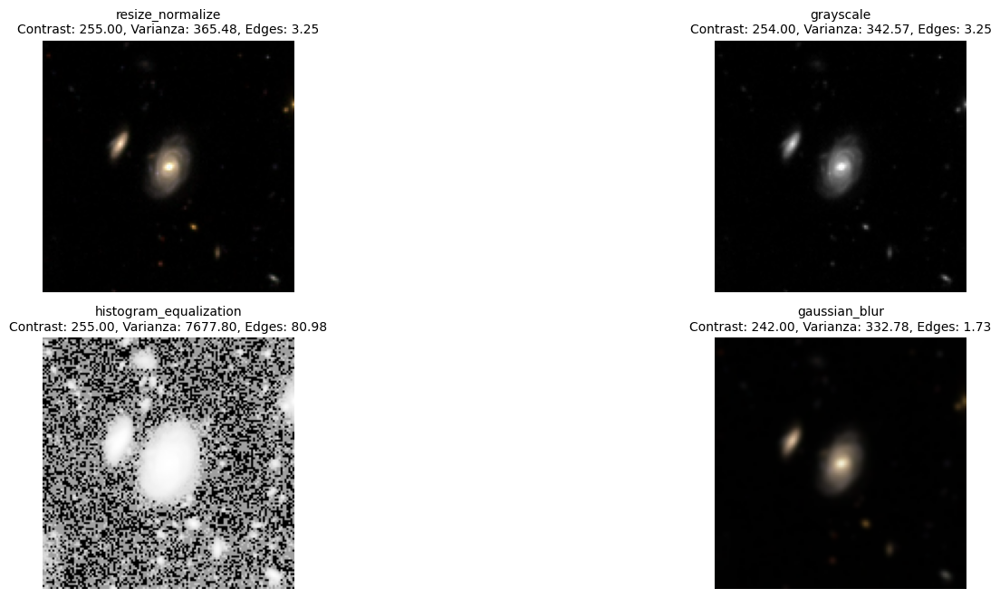


Visualizando preprocesamiento para Galaxias Enanas...

Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J160527.69+413856.0.jpg


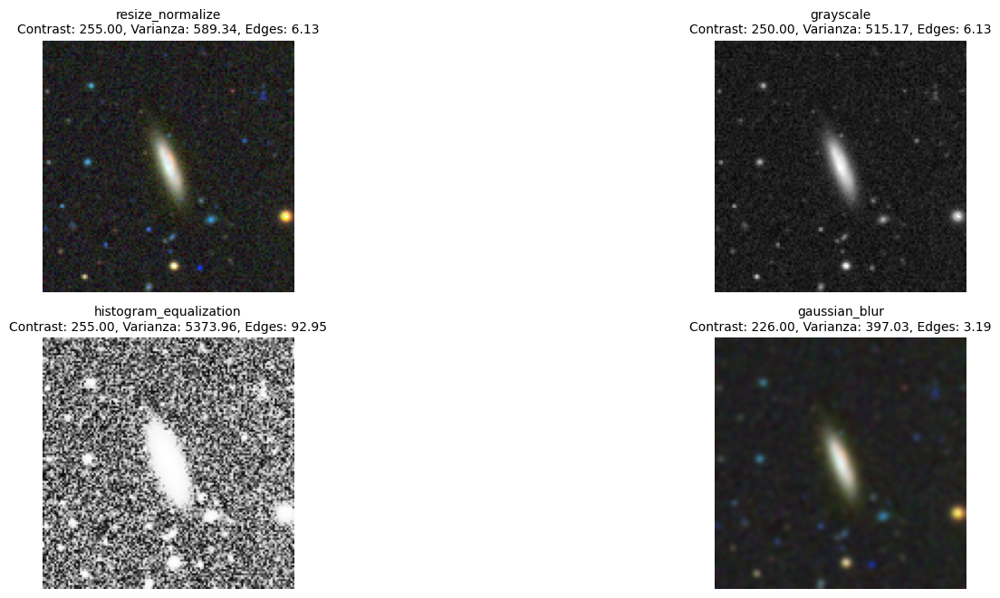


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J125346.63+272308.7.jpg


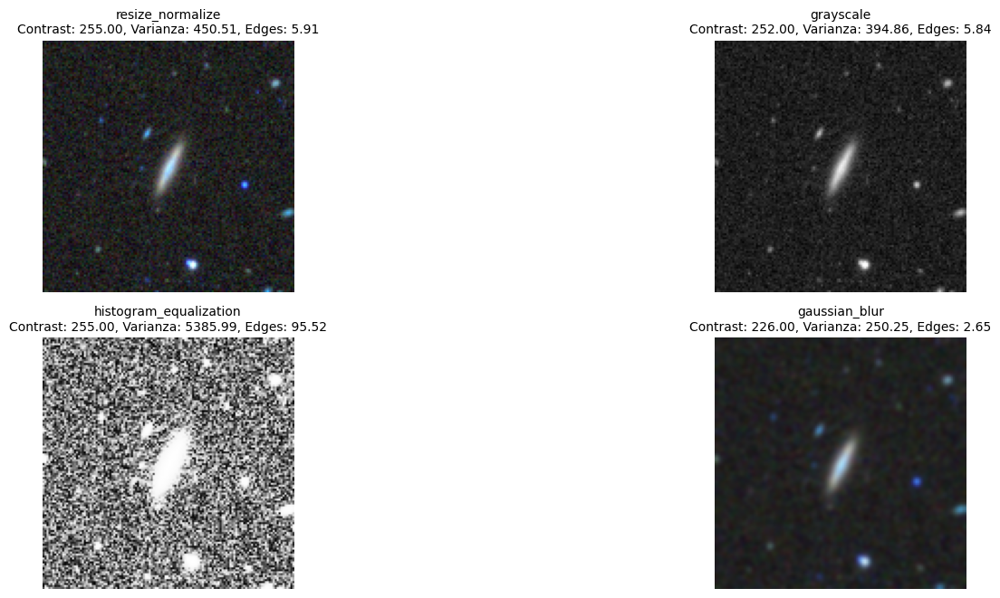


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J094405.01+004400.7.jpg


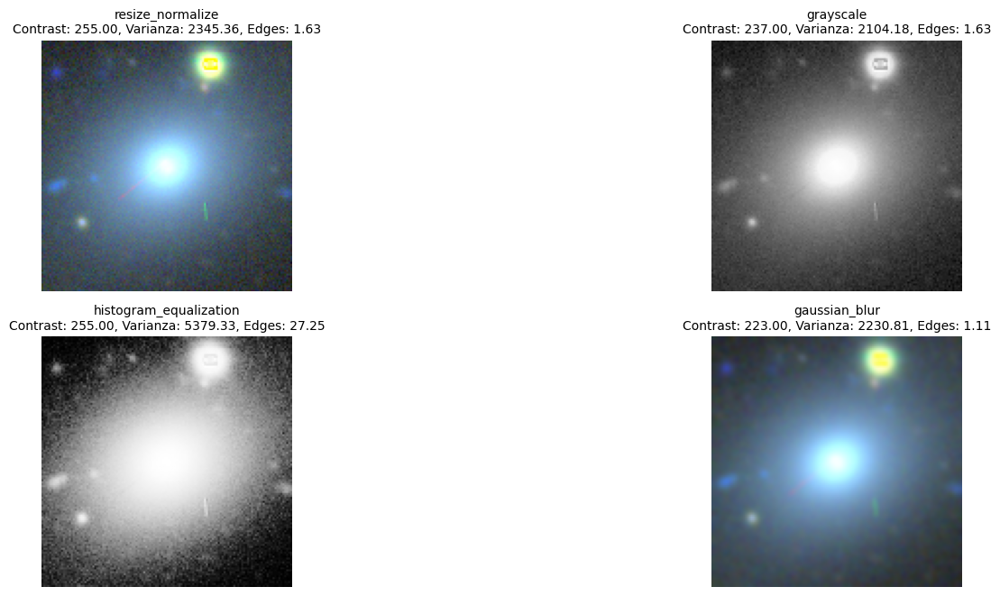


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J144029.40+032557.92.jpg


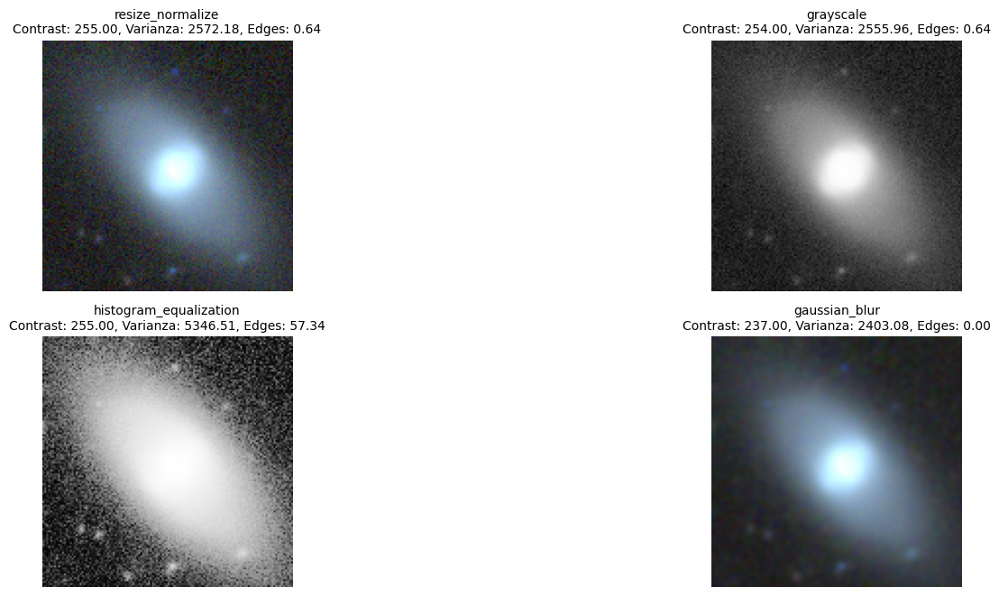


Evaluando preprocesamiento para: /content/drive/MyDrive/CNN/Sample_Mor_Image/J015859.65+005430.4.jpg


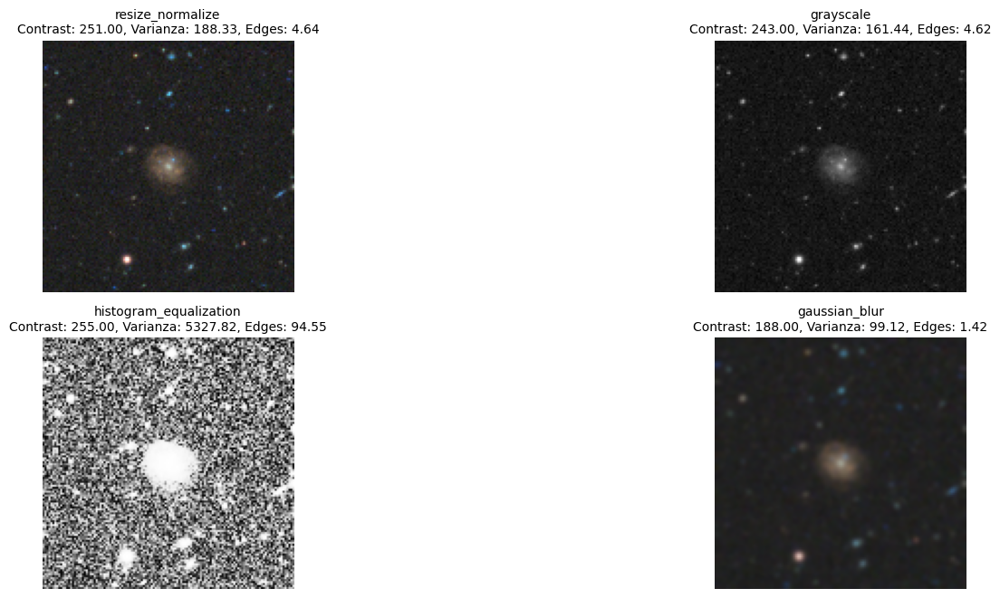

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Definir los paths de las carpetas
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Técnicas de preprocesamiento
def resize_and_normalize(image):
    resized = cv2.resize(image, (128, 128))
    normalized = resized / 255.0
    return (normalized * 255).astype(np.uint8)

def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, (128, 128)).astype(np.uint8)

def histogram_equalization(image):
    grayscale = convert_to_grayscale(image)
    return cv2.equalizeHist(grayscale).astype(np.uint8)

def gaussian_blur(image):
    blurred = cv2.GaussianBlur(cv2.resize(image, (128, 128)), (5, 5), 0)
    return blurred.astype(np.uint8)

# Mapear técnicas de preprocesamiento
preprocess_techniques = {
    "resize_normalize": resize_and_normalize,
    "grayscale": convert_to_grayscale,
    "histogram_equalization": histogram_equalization,
    "gaussian_blur": gaussian_blur,
}

# Cargar imagen
def load_image(image_path):
    return cv2.imread(image_path)

# Evaluar métricas
def evaluate_preprocessing(image, preprocess_fn):
    processed_image = preprocess_fn(image)

    # Calcular métricas
    contrast = processed_image.max() - processed_image.min()
    varianza = np.var(processed_image)

    # Densidad de bordes (Canny)
    if len(processed_image.shape) == 3:  # Convertir a escala de grises si es necesario
        gray_image = cv2.cvtColor(processed_image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = processed_image
    edges = cv2.Canny(gray_image, 100, 200)
    edge_density = np.sum(edges) / edges.size  # Densidad de bordes

    return contrast, varianza, edge_density, processed_image

# Visualizar resultados con métricas
def visualize_results(image_path, preprocess_techniques):
    original_image = load_image(image_path)
    plt.figure(figsize=(15, 10))

    for i, (technique_name, preprocess_fn) in enumerate(preprocess_techniques.items()):
        contrast, varianza, edge_density, processed_image = evaluate_preprocessing(original_image, preprocess_fn)

        plt.subplot(3, 2, i + 1)
        if len(processed_image.shape) == 2:  # Grayscale
            plt.imshow(processed_image, cmap='gray')
        else:
            plt.imshow(processed_image)
        plt.title(
            f"{technique_name}\nContrast: {contrast:.2f}, Varianza: {varianza:.2f}, Edges: {edge_density:.2f}",
            fontsize=10,
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Seleccionar 5 imágenes de cada carpeta
def select_images(image_path, max_images=5):
    image_files = [f for f in os.listdir(image_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    selected_files = image_files[:max_images]
    return [os.path.join(image_path, img) for img in selected_files]

# Evaluar y guardar resultados en una tabla
def evaluate_and_save_results(image_paths, preprocess_techniques):
    results = []
    for img_path in image_paths:
        original_image = load_image(img_path)
        for technique_name, preprocess_fn in preprocess_techniques.items():
            contrast, varianza, edge_density, _ = evaluate_preprocessing(original_image, preprocess_fn)
            results.append({
                "Image": img_path,
                "Technique": technique_name,
                "Contrast": contrast,
                "Variance": varianza,
                "Edge Density": edge_density
            })
    return pd.DataFrame(results)

# Evaluar y visualizar técnicas de preprocesamiento para varias imágenes
def visualize_preprocessing_for_folder(folder_path, label, preprocess_techniques, max_images=5):
    # Seleccionar imágenes
    image_paths = select_images(folder_path, max_images)
    for img_path in image_paths:
        print(f"\nEvaluando preprocesamiento para: {img_path}")
        visualize_results(img_path, preprocess_techniques)

# Procesar y guardar métricas
galaxy_image_paths = select_images(GALAXY_PATH, max_images=5)
dwarf_image_paths = select_images(DWARF_PATH, max_images=5)

print("Evaluando y guardando resultados para Galaxias...")
galaxy_results = evaluate_and_save_results(galaxy_image_paths, preprocess_techniques)

print("Evaluando y guardando resultados para Galaxias Enanas...")
dwarf_results = evaluate_and_save_results(dwarf_image_paths, preprocess_techniques)

# Combinar resultados
all_results = pd.concat([galaxy_results, dwarf_results])

# Mostrar el DataFrame
print("\nResultados de Preprocesamiento:")
print(all_results)

# Guardar resultados en un archivo CSV
all_results.to_csv("preprocessing_results.csv", index=False)
print("\nLos resultados se han guardado en 'preprocessing_results.csv'.")

# Determinar la mejor técnica en promedio (excluyendo 'Image')
numeric_columns = ["Contrast", "Variance", "Edge Density"]
mean_metrics = all_results.groupby("Technique")[numeric_columns].mean()

# Seleccionar la mejor técnica según la media de las métricas
best_technique = mean_metrics.mean(axis=1).idxmax()
best_technique_values = mean_metrics.loc[best_technique]

print("\nMejor técnica en promedio:")
print(f"Técnica: {best_technique}")
print(best_technique_values)

# Guardar las métricas promedio en un archivo CSV
mean_metrics.to_csv("average_metrics.csv")
print("\nLas métricas promedio por técnica se han guardado en 'average_metrics.csv'.")

# Visualizar preprocesamiento
print("Visualizando preprocesamiento para Galaxias...")
visualize_preprocessing_for_folder(GALAXY_PATH, "Galaxias", preprocess_techniques)

print("\nVisualizando preprocesamiento para Galaxias Enanas...")
visualize_preprocessing_for_folder(DWARF_PATH, "Galaxias Enanas", preprocess_techniques)


Error al cargar la imagen: /content/drive/MyDrive/CNN/Sample_Mor_Image/J160534.61+490537.24.jpg

EDA para Galaxias vs No Galaxias:
Total de imágenes: 1004
Tamaños únicos: {(424, 424), (800, 800)}


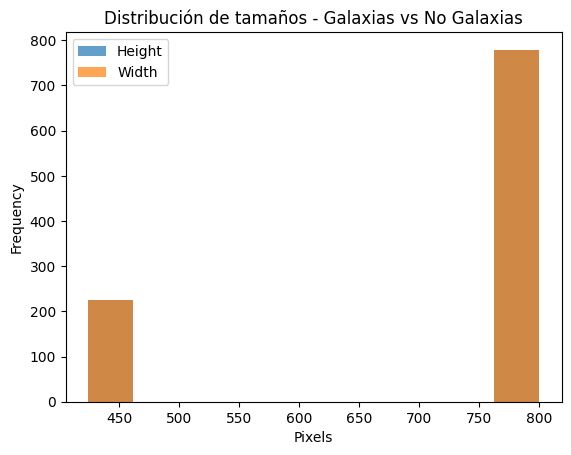


Entrenando modelo para Galaxias vs No Galaxias con histogram_equalization y Cross-Validation...

Fold 1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step


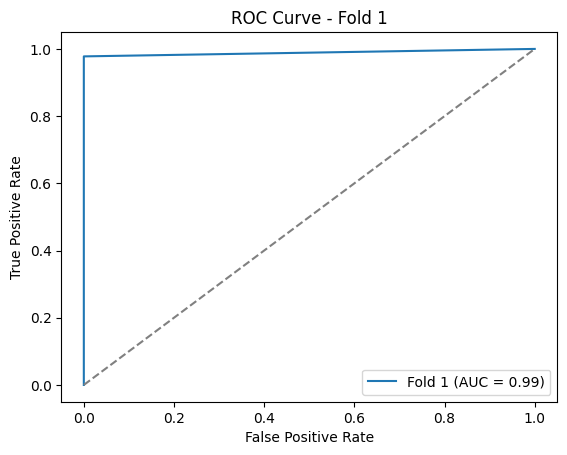


Fold 2


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step


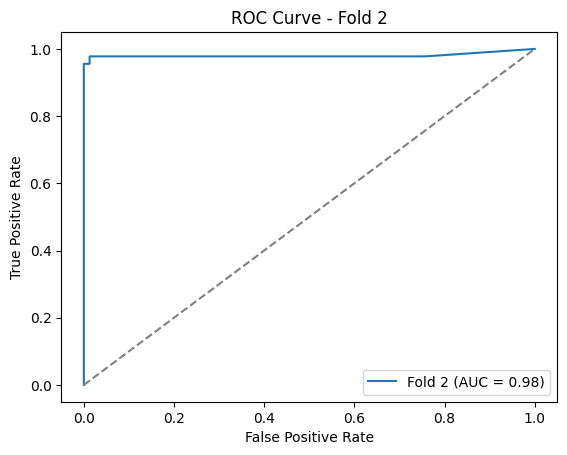


Fold 3


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step


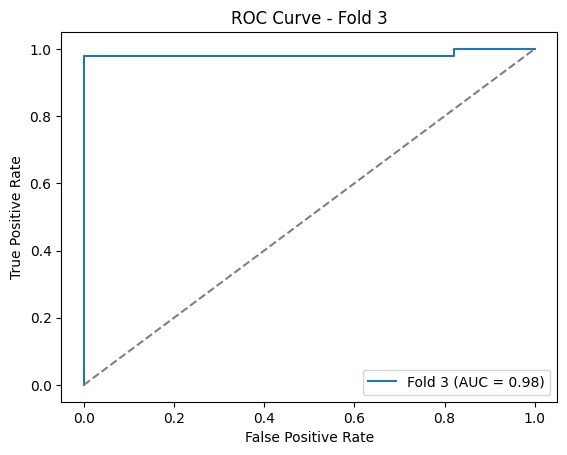


Fold 4


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step


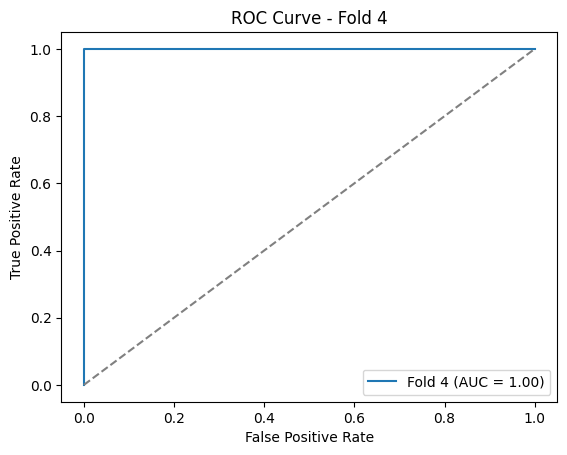


Fold 5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step


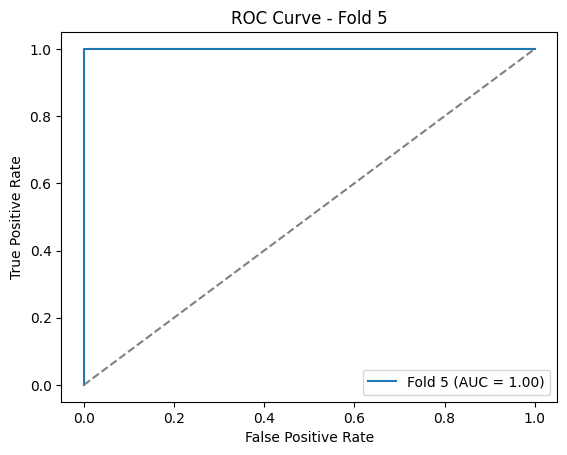


Promedio AUC para Galaxias vs No Galaxias (histogram_equalization): 0.99

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       779
           1       1.00      0.96      0.98       225

    accuracy                           0.99      1004
   macro avg       0.99      0.98      0.99      1004
weighted avg       0.99      0.99      0.99      1004



In [5]:


# Importar bibliotecas
import os
import cv2
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt

# Parámetros globales
TARGET_SIZE = (128, 128)

# Técnica de preprocesamiento seleccionada

def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, (128, 128)).astype(np.uint8)

def histogram_equalization(image):
    grayscale = convert_to_grayscale(image)
    return cv2.equalizeHist(grayscale).astype(np.uint8)

# Cargar imágenes con etiquetas
def load_images(image_path, label):
    images = []
    labels = []
    for img_name in os.listdir(image_path):
        img_path = os.path.join(image_path, img_name)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Error al cargar la imagen: {img_path}")
            continue
        images.append(img)
        labels.append(label)
    return images, labels

# Crear modelo CNN
def create_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Clasificación binaria
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# EDA
def perform_eda(image_paths, labels, label_name):
    image_sizes = [img.shape[:2] for img in image_paths]
    unique_sizes = set(image_sizes)
    print(f"\nEDA para {label_name}:")
    print(f"Total de imágenes: {len(image_paths)}")
    print(f"Tamaños únicos: {unique_sizes}")
    plt.hist([size[0] for size in image_sizes], bins=10, alpha=0.7, label='Height')
    plt.hist([size[1] for size in image_sizes], bins=10, alpha=0.7, label='Width')
    plt.xlabel("Pixels")
    plt.ylabel("Frequency")
    plt.title(f"Distribución de tamaños - {label_name}")
    plt.legend()
    plt.show()

# Entrenar y evaluar modelo con Cross-Validation
def train_model_with_histogram_equalization(images, labels, label_name):
    print(f"\nEntrenando modelo para {label_name} con histogram_equalization y Cross-Validation...")

    # Aplicar preprocesamiento con histogram_equalization
    preprocess_fn = histogram_equalization
    X = np.array([preprocess_fn(img) for img in images])
    y = np.array(labels)

    # Expandir dimensión si las imágenes son en escala de grises
    if len(X.shape) == 3:
        X = X[..., np.newaxis]

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    all_y_true, all_y_pred = [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\nFold {fold + 1}")

        # Dividir en entrenamiento y validación
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # Crear modelo CNN
        model = create_model((TARGET_SIZE[0], TARGET_SIZE[1], X_train.shape[-1]))

        # Entrenar modelo
        model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=0)

        # Predicciones y métricas
        y_pred_prob = model.predict(X_val).ravel()
        y_pred = (y_pred_prob > 0.5).astype(int)
        all_y_true.extend(y_val)
        all_y_pred.extend(y_pred)

        # Calcular curva ROC y AUC
        fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)

        # Graficar curva ROC
        plt.figure()
        plt.plot(fpr, tpr, label=f"Fold {fold + 1} (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.title(f"ROC Curve - Fold {fold + 1}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.show()

    # Promedio AUC
    avg_auc = np.mean(auc_scores)
    print(f"\nPromedio AUC para {label_name} (histogram_equalization): {avg_auc:.2f}")

    # Reporte de clasificación final
    print("\nReporte de Clasificación:")
    print(classification_report(all_y_true, all_y_pred))

# Galaxias vs No Galaxias
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Cargar imágenes y etiquetas
galaxy_images, galaxy_labels = load_images(GALAXY_PATH, 1)
dwarf_images, dwarf_labels = load_images(DWARF_PATH, 0)

# Combinar datos
all_images = galaxy_images + dwarf_images
all_labels = galaxy_labels + dwarf_labels

# EDA
perform_eda(all_images, all_labels, "Galaxias vs No Galaxias")

# Entrenar modelo usando histogram_equalization
train_model_with_histogram_equalization(all_images, all_labels, "Galaxias vs No Galaxias")


# Base de Datos Vectorizada: Pinecone

¿Qué es una base de datos vectorizada?

Una base de datos vectorizada almacena y gestiona representaciones numéricas (vectores) de datos no estructurados como imágenes, texto o audio.

Estas bases de datos son útiles para realizar búsquedas semánticas, agrupamiento y clasificación.

**Uso de Pinecone:**

Se utilizó Pinecone para almacenar los vectores generados de las imágenes de galaxias y galaxias enanas. Cada vector tiene 1024 dimensiones.

Se crearon dos namespaces: "Galaxia" y "Galaxia_Enana", para diferenciar entre las clases.

In [2]:
pip install pinecone

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.3/427.3 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 5.9 MB/s eta 0:00:00


In [ ]:
import cv2
import matplotlib.pyplot as plt
from pinecone import Pinecone

# Configurar Pinecone
pc = Pinecone(api_key="pcsk_5WxGhM_J25i9UCSSFDyP1fdjuaVUWJVXxbVtAcqW5n7PQ19b2CM3RxMJpZhZUuwp7PTQtk")
index_name = "galaxytec"
index = pc.Index(index_name)

# Ruta base de las imágenes
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Función para recuperar imágenes desde sus IDs
def get_image_from_id(image_id):
    # Determinar el path según el prefijo en el ID
    if "galaxia" in image_id and "enana" not in image_id:
        base_path = GALAXY_PATH
    elif "galaxia_enana" in image_id:
        base_path = DWARF_PATH
    else:
        raise ValueError(f"No se encontró una ruta válida para el ID: {image_id}")

    # Extraer el nombre del archivo desde el ID
    image_name = image_id.split("-")[1]  # Tomar la parte después del guión
    image_path = f"{base_path}/{image_name}"

    # Leer la imagen
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"No se pudo cargar la imagen: {image_path}")
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir a RGB para matplotlib

# Lista de IDs para recuperar imágenes
vector_ids = [
    "galaxia-W3-383_color.jpg",
    "galaxia_enana-J033601.58+010617.10.jpg",
    "galaxia_enana-J080143.32+314335.7.jpg",
    "galaxia_enana-J025710.46-005020.88.jpg",
    "galaxia-W1-360_color.jpg"
]

# Visualizar imágenes
def visualize_images(vector_ids):
    plt.figure(figsize=(15, 10))
    for i, image_id in enumerate(vector_ids):
        try:
            image = get_image_from_id(image_id)
            plt.subplot(1, len(vector_ids), i + 1)
            plt.imshow(image)
            plt.title(image_id.split("-")[1])
            plt.axis("off")
        except Exception as e:
            print(f"Error al cargar la imagen para ID '{image_id}': {e}")
    plt.tight_layout()
    plt.show()

# Ejecutar la visualización
visualize_images(vector_ids)


In [14]:
import os
import cv2
import numpy as np
from pinecone import Pinecone, ServerlessSpec

# Configurar Pinecone
pc = Pinecone(api_key="pcsk_5WxGhM_J25i9UCSSFDyP1fdjuaVUWJVXxbVtAcqW5n7PQ19b2CM3RxMJpZhZUuwp7PTQtk")

# Crear el índice con el nombre 'galaxytec'
index_name = "galaxytec"
if index_name not in [idx.name for idx in pc.list_indexes()]:
    pc.create_index(
        name=index_name,
        dimension=1024,  # Dimensiones ajustadas al índice
        metric="cosine",
        spec=ServerlessSpec(
            cloud="aws",
            region="us-east-1"
        )
    )

# Acceder al índice
index = pc.Index(index_name)

# Definir los paths de las carpetas
GALAXY_PATH = "/content/drive/MyDrive/CNN/Sample_ISB_Image"  # Galaxias
DWARF_PATH = "/content/drive/MyDrive/CNN/Sample_Mor_Image"  # Galaxias Enanas

# Preprocesamiento con equalización de histograma
def convert_to_grayscale(image):
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.resize(grayscale, (128, 128)).astype(np.uint8)

def histogram_equalization(image):
    grayscale = convert_to_grayscale(image)
    return cv2.equalizeHist(grayscale).astype(np.uint8)

# Generar vectores con dimensiones exactas de 1024
def generate_vectors(image_path, label):
    vectors = []
    image_files = [f for f in os.listdir(image_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    for img_file in image_files:
        img_path = os.path.join(image_path, img_file)
        image = cv2.imread(img_path)

        if image is None:  # Validar que la imagen se cargó correctamente
            print(f"Error al cargar la imagen: {img_path}. Saltando...")
            continue

        processed_image = histogram_equalization(image)

        # Aplanar la imagen procesada para crear el vector
        feature_vector = processed_image.flatten().astype(np.float32)

        # Ajustar a 1024 dimensiones
        if feature_vector.shape[0] < 1024:
            feature_vector = np.pad(feature_vector, (0, 1024 - feature_vector.shape[0]), mode='constant')
        elif feature_vector.shape[0] > 1024:
            feature_vector = feature_vector[:1024]

        # Normalizar el vector
        feature_vector /= np.linalg.norm(feature_vector)

        # Añadir a la lista de vectores
        vectors.append((f"{label}-{img_file}", feature_vector.tolist(), {"label": label}))
    return vectors

# Subir vectores en lotes
def upsert_in_batches(index, vectors, batch_size=100):
    for i in range(0, len(vectors), batch_size):
        batch = vectors[i:i + batch_size]
        index.upsert(vectors=batch)
        print(f"Lote {i // batch_size + 1} subido exitosamente.")

# Procesar y subir vectores para Galaxias y Galaxias Enanas
print("Procesando y subiendo vectores de Galaxias...")
galaxy_vectors = generate_vectors(GALAXY_PATH, "galaxia")
upsert_in_batches(index, galaxy_vectors)

print("Procesando y subiendo vectores de Galaxias Enanas...")
dwarf_vectors = generate_vectors(DWARF_PATH, "galaxia_enana")
upsert_in_batches(index, dwarf_vectors)

print("Vectores subidos exitosamente.")

# Opcional: Buscar y visualizar algunos vectores en Pinecone
def search_vector(query_vector, top_k=5):
    results = index.query(vector=query_vector.tolist(), top_k=top_k, include_metadata=True)
    for match in results["matches"]:
        print(f"ID: {match['id']}, Score: {match['score']}, Metadata: {match['metadata']}")

# Buscar un vector de ejemplo
if os.listdir(GALAXY_PATH):  # Asegurarse de que hay imágenes en el path
    print("\nResultados de búsqueda para un vector de galaxia:")
    example_image = cv2.imread(os.path.join(GALAXY_PATH, os.listdir(GALAXY_PATH)[0]))
    processed_example = histogram_equalization(example_image).flatten().astype(np.float32)

    # Ajustar a 1024 dimensiones
    if processed_example.shape[0] < 1024:
        processed_example = np.pad(processed_example, (0, 1024 - processed_example.shape[0]), mode='constant')
    elif processed_example.shape[0] > 1024:
        processed_example = processed_example[:1024]

    processed_example /= np.linalg.norm(processed_example)  # Normalizar
    search_vector(processed_example)
else:
    print("No hay imágenes disponibles en el path de galaxias para realizar la búsqueda.")


Procesando y subiendo vectores de Galaxias...
Lote 1 subido exitosamente.
Lote 2 subido exitosamente.
Lote 3 subido exitosamente.
Procesando y subiendo vectores de Galaxias Enanas...
Error al cargar la imagen: /content/drive/MyDrive/CNN/Sample_Mor_Image/J160534.61+490537.24.jpg. Saltando...
Lote 1 subido exitosamente.
Lote 2 subido exitosamente.
Lote 3 subido exitosamente.
Lote 4 subido exitosamente.
Lote 5 subido exitosamente.
Lote 6 subido exitosamente.
Lote 7 subido exitosamente.
Lote 8 subido exitosamente.
Lote 9 subido exitosamente.
Lote 10 subido exitosamente.
Vectores subidos exitosamente.

Resultados de búsqueda para un vector de galaxia:
ID: galaxia-W3-383_color.jpg, Score: 1.00000012, Metadata: {'label': 'galaxia'}
ID: galaxia_enana-J033601.58+010617.10.jpg, Score: 0.756443, Metadata: {'label': 'galaxia_enana'}
ID: galaxia_enana-J080143.32+314335.7.jpg, Score: 0.71209228, Metadata: {'label': 'galaxia_enana'}
ID: galaxia_enana-J025710.46-005020.88.jpg, Score: 0.704274, Metadat

In [7]:
import numpy as np
from pinecone import Pinecone

# Configurar Pinecone
pc = Pinecone(api_key="pcsk_5WxGhM_J25i9UCSSFDyP1fdjuaVUWJVXxbVtAcqW5n7PQ19b2CM3RxMJpZhZUuwp7PTQtk")
index_name = "galaxytec"
index = pc.Index(index_name)

# Cargar vectores por etiqueta desde el índice
def load_vectors_by_label(index, label, batch_size=100):
    print(f"Cargando vectores con label '{label}'...")
    vectors = []
    offset = ""
    while True:
        response = index.query(
            vector=[0] * 1024,  # Vector ficticio de la dimensión del índice
            namespace="",  # Namespace por defecto
            top_k=batch_size,
            filter={"label": {"$eq": label}},
            include_metadata=True,
            include_values=True
        )
        for match in response["matches"]:
            vectors.append({
                "ID": match["id"],
                "Values": match["values"],
                "Metadata": match["metadata"]
            })
        offset = response.get("next_offset", "")
        if not offset:
            break
    if not vectors:
        print(f"No se encontraron vectores con el label '{label}'.")
    return vectors

# Cargar vectores de galaxias y galaxias enanas
galaxy_vectors = load_vectors_by_label(index, "galaxia")
dwarf_vectors = load_vectors_by_label(index, "galaxia_enana")

print(f"Vectores de galaxias cargados: {len(galaxy_vectors)}")
print(f"Vectores de galaxias enanas cargados: {len(dwarf_vectors)}")

# Mostrar ejemplos de vectores
def show_example_vectors(vectors, label, num_examples=5):
    print(f"Mostrando {num_examples} ejemplos para '{label}':")
    for i, vector in enumerate(vectors[:num_examples]):
        print(f"ID: {vector['ID']}, Metadata: {vector['Metadata']}")
        print(f"Valores (truncados): {vector['Values'][:10]}...")
        print("-" * 50)

show_example_vectors(galaxy_vectors, "galaxia")
show_example_vectors(dwarf_vectors, "galaxia_enana")


Cargando vectores con label 'galaxia'...
Cargando vectores con label 'galaxia_enana'...
Vectores de galaxias cargados: 100
Vectores de galaxias enanas cargados: 100
Mostrando 5 ejemplos para 'galaxia':
ID: galaxia-W3-539_color.jpg, Metadata: {'label': 'galaxia'}
Valores (truncados): [0.0, 0.0415076055, 0.0415076055, 0.0415076055, 0.0415076055, 0.0, 0.0, 0.0, 0.0, 0.0415076055]...
--------------------------------------------------
ID: galaxia-W1-281_color.jpg, Metadata: {'label': 'galaxia'}
Valores (truncados): [0.0361815207, 0.0361815207, 0.0361815207, 0.0361815207, 0.0, 0.0433404297, 0.0, 0.0, 0.0361815207, 0.0433404297]...
--------------------------------------------------
ID: galaxia-W3-670_color.jpg, Metadata: {'label': 'galaxia'}
Valores (truncados): [0.0364227332, 0.0364227332, 0.0364227332, 0.0364227332, 0.0364227332, 0.0364227332, 0.0364227332, 0.0364227332, 0.0, 0.0]...
--------------------------------------------------
ID: galaxia-W3-455_color.jpg, Metadata: {'label': 'galaxi

# Selección de Características

Se usó ANOVA para identificar las características más relevantes:

**ANOVA: Evalúa la relevancia estadística de cada característica respecto a las etiquetas de clase.**

Superó a PCA y Random Forest al identificar características con mayor separación estadística entre galaxias y galaxias enanas.

Es ideal para datos con relaciones lineales claras entre características y etiquetas.

Resultados:

**ANOVA seleccionó las 10 características más relevantes para ambas clases.**

In [14]:
import numpy as np
import pandas as pd
from pinecone import Pinecone
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif

# Configurar Pinecone
pc = Pinecone(api_key="pcsk_5WxGhM_J25i9UCSSFDyP1fdjuaVUWJVXxbVtAcqW5n7PQ19b2CM3RxMJpZhZUuwp7PTQtk")
index_name = "galaxytec"
index = pc.Index(index_name)

# Cargar vectores por etiqueta desde el índice
def load_vectors_by_label(index, label, batch_size=100):
    print(f"Cargando vectores con label '{label}'...")
    vectors = []
    labels = []
    offset = ""
    while True:
        response = index.query(
            vector=[0] * 1024,  # Vector ficticio de la dimensión del índice
            namespace="",  # Namespace por defecto
            top_k=batch_size,
            filter={"label": {"$eq": label}},
            include_metadata=True,
            include_values=True
        )
        for match in response["matches"]:
            vectors.append(match["values"])
            labels.append(match["metadata"]["label"])
        offset = response.get("next_offset", "")
        if not offset:
            break
    if not vectors:
        print(f"No se encontraron vectores con el label '{label}'.")
    return np.array(vectors), np.array(labels)

# Mostrar ejemplos de vectores
def show_example_vectors(vectors, labels, label_name, num_examples=5):
    print(f"Mostrando {num_examples} ejemplos para '{label_name}':")
    for i, (vector, label) in enumerate(zip(vectors[:num_examples], labels[:num_examples])):
        print(f"Vector {i + 1}:")
        print(f"Label: {label}")
        print(f"Valores (truncados): {vector[:10]}...")
        print("-" * 50)

# Selección de características
def select_features(vectors, labels, n_features=10):
    print(f"Seleccionando características relevantes...")
    labels_encoded = pd.factorize(labels)[0]

    # PCA
    pca = PCA(n_components=min(n_features, vectors.shape[1]))
    pca_result = pca.fit_transform(vectors)
    pca_importance = pca.explained_variance_ratio_

    # Random Forest
    rf = RandomForestClassifier(random_state=42)
    rf.fit(vectors, labels_encoded)
    rf_importance = rf.feature_importances_

    # ANOVA
    anova_selector = SelectKBest(score_func=f_classif, k=min(n_features, vectors.shape[1]))
    anova_selector.fit(vectors, labels_encoded)
    anova_scores = anova_selector.scores_

    return {
        "PCA": (pca_result, pca_importance),
        "RandomForest": rf_importance,
        "ANOVA": anova_scores,
    }

# Comparar técnicas y determinar la mejor
def compare_feature_selection_techniques(feature_selection_results):
    scores = {
        technique: np.mean(results[1]) if technique == "PCA" else np.mean(results)
        for technique, results in feature_selection_results.items()
    }
    best_technique = max(scores, key=scores.get)
    print(f"Mejor técnica de selección de características: {best_technique}")
    return best_technique

# Cargar vectores de galaxias y galaxias enanas
galaxy_vectors, galaxy_labels = load_vectors_by_label(index, "galaxia")
dwarf_vectors, dwarf_labels = load_vectors_by_label(index, "galaxia_enana")

print(f"Vectores de galaxias cargados: {len(galaxy_vectors)}")
print(f"Vectores de galaxias enanas cargados: {len(dwarf_vectors)}")

# Mostrar ejemplos
show_example_vectors(galaxy_vectors, galaxy_labels, "galaxia")
show_example_vectors(dwarf_vectors, dwarf_labels, "galaxia_enana")

# Combinar datos para el análisis
all_vectors = np.vstack([galaxy_vectors, dwarf_vectors])
all_labels = np.hstack([galaxy_labels, dwarf_labels])

# Seleccionar características
feature_selection_results = select_features(all_vectors, all_labels, n_features=10)

# Determinar la mejor técnica
best_technique = compare_feature_selection_techniques(feature_selection_results)

# Mostrar resultados de cada técnica
for technique, results in feature_selection_results.items():
    print(f"Técnica: {technique}")
    if technique == "PCA":
        print(f"Importancia de componentes: {results[1]}")
    else:
        print(f"Importancia de características: {results}")


Cargando vectores con label 'galaxia'...
Cargando vectores con label 'galaxia_enana'...
Vectores de galaxias cargados: 100
Vectores de galaxias enanas cargados: 100
Mostrando 5 ejemplos para 'galaxia':
Vector 1:
Label: galaxia
Valores (truncados): [0.         0.04150761 0.04150761 0.04150761 0.04150761 0.
 0.         0.         0.         0.04150761]...
--------------------------------------------------
Vector 2:
Label: galaxia
Valores (truncados): [0.03618152 0.03618152 0.03618152 0.03618152 0.         0.04334043
 0.         0.         0.03618152 0.04334043]...
--------------------------------------------------
Vector 3:
Label: galaxia
Valores (truncados): [0.03642273 0.03642273 0.03642273 0.03642273 0.03642273 0.03642273
 0.03642273 0.03642273 0.         0.        ]...
--------------------------------------------------
Vector 4:
Label: galaxia
Valores (truncados): [0.         0.03933727 0.03933727 0.         0.03933727 0.03933727
 0.03933727 0.03933727 0.         0.03933727]...
-----

In [15]:
import numpy as np
from pinecone import Pinecone

# Configurar Pinecone
pc = Pinecone(api_key="pcsk_5WxGhM_J25i9UCSSFDyP1fdjuaVUWJVXxbVtAcqW5n7PQ19b2CM3RxMJpZhZUuwp7PTQtk")
index_name = "galaxytec"
index = pc.Index(index_name)

# Cargar vectores por etiqueta desde el índice
def load_vectors_by_label(index, label, batch_size=100):
    print(f"Cargando vectores con label '{label}'...")
    vectors = []
    labels = []
    offset = ""
    while True:
        response = index.query(
            vector=[0] * 1024,  # Vector ficticio de la dimensión del índice
            namespace="",  # Namespace por defecto
            top_k=batch_size,
            filter={"label": {"$eq": label}},
            include_metadata=True,
            include_values=True
        )
        for match in response["matches"]:
            vectors.append(match["values"])
            labels.append(match["metadata"]["label"])
        offset = response.get("next_offset", "")
        if not offset:
            break
    if not vectors:
        print(f"No se encontraron vectores con el label '{label}'.")
    return np.array(vectors), np.array(labels)

# Guardar vectores reducidos en Pinecone
def save_reduced_vectors(index, vectors, labels, namespace, target_dim=1024):
    print(f"Guardando vectores en el namespace '{namespace}'...")
    # Ajustar dimensiones a 1024
    adjusted_vectors = []
    for vec in vectors:
        if len(vec) < target_dim:
            vec = np.pad(vec, (0, target_dim - len(vec)), mode='constant')
        elif len(vec) > target_dim:
            vec = vec[:target_dim]
        adjusted_vectors.append(vec)
    formatted_vectors = [
        (f"{namespace}-{i}", adjusted_vectors[i].tolist(), {"label": labels[i]})
        for i in range(len(adjusted_vectors))
    ]
    for i in range(0, len(formatted_vectors), 100):
        batch = formatted_vectors[i:i + 100]
        index.upsert(vectors=batch, namespace=namespace)
        print(f"Lote {i // 100 + 1} subido exitosamente en namespace '{namespace}'.")

# Flujo principal
def save_features_by_namespace(index, best_features, galaxy_labels, dwarf_labels):
    print("Guardando vectores reducidos en namespaces separados...")

    # Guardar vectores reducidos para Galaxias
    save_reduced_vectors(index, best_features["galaxia"], galaxy_labels, "Galaxia")

    # Guardar vectores reducidos para Galaxias Enanas
    save_reduced_vectors(index, best_features["galaxia_enana"], dwarf_labels, "Galaxia_Enana")

    print("Vectores guardados exitosamente en los namespaces correspondientes.")

# Flujo completo
def main(index):
    # Cargar vectores por etiquetas
    galaxy_vectors, galaxy_labels = load_vectors_by_label(index, "galaxia")
    dwarf_vectors, dwarf_labels = load_vectors_by_label(index, "galaxia_enana")

    # Combinar datos para aplicar ANOVA
    print("Seleccionando características relevantes con ANOVA...")
    from sklearn.feature_selection import SelectKBest, f_classif
    all_vectors = np.vstack([galaxy_vectors, dwarf_vectors])
    all_labels = np.hstack([galaxy_labels, dwarf_labels])
    labels_encoded = np.array([1 if lbl == "galaxia_enana" else 0 for lbl in all_labels])

    # Selección ANOVA
    selector = SelectKBest(score_func=f_classif, k=10)
    reduced_vectors = selector.fit_transform(all_vectors, labels_encoded)

    # Dividir los vectores reducidos en sus respectivas etiquetas
    best_features = {
        "galaxia": reduced_vectors[:len(galaxy_vectors)],
        "galaxia_enana": reduced_vectors[len(galaxy_vectors):],
    }

    # Guardar vectores en Pinecone en dos namespaces
    save_features_by_namespace(index, best_features, galaxy_labels, dwarf_labels)

# Ejecutar flujo
main(index)


Cargando vectores con label 'galaxia'...
Cargando vectores con label 'galaxia_enana'...
Seleccionando características relevantes con ANOVA...
Guardando vectores reducidos en namespaces separados...
Guardando vectores en el namespace 'Galaxia'...
Lote 1 subido exitosamente en namespace 'Galaxia'.
Guardando vectores en el namespace 'Galaxia_Enana'...
Lote 1 subido exitosamente en namespace 'Galaxia_Enana'.
Vectores guardados exitosamente en los namespaces correspondientes.


# Uso Futuro en la CNN

Los vectores almacenados en Pinecone pueden ser utilizados para entrenar una CNN de la siguiente manera:

Extraer vectores de Pinecone utilizando consultas basadas en namespaces.

Dividir los vectores en conjuntos de entrenamiento y prueba.

Usar los vectores como entrada para la CNN, aprovechando su dimensionalidad reducida y su relevancia calculada mediante ANOVA.

# Conclusión

El proceso descrito optimiza la clasificación de galaxias y galaxias enanas mediante:

  1.Preprocesamiento eficiente para
    mejorar la calidad de los datos.

  2.Selección de características relevantes para reducir dimensionalidad y evitar sobreajuste.

  3.Almacenamiento estructurado en Pinecone para facilitar consultas y escalabilidad futura.